# 2 Exploratory Data Analysis<a id='2_exploratory_data_analysis'></a>

In [1]:
# Import external libraries
import os
import sys
from datetime import datetime
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import talib as ta

In [2]:
# Import local libraries
sys.path.append('..') # Add parent folder for local library imports

# Feature creation functions
from src.features.make_features import *
# Helper functions
from src.utils.helpers import *
# Visualization functions
from src.visuals.make_plots import *

# Load the "autoreload" extension so that code can change
%load_ext autoreload
%reload_ext autoreload

# Always reload modules so that as you change code in src, it gets loaded
%autoreload 2

## 2.1 Load Data

In [3]:
# Set this to svg when publishing to GitHub so plotly images are static
renderer = 'svg'

In [4]:
# Data directory references
interim_dir = r'..\data\interim'

In [5]:
btc = pd.read_csv(os.path.join(interim_dir, 'btc.csv'), parse_dates=['date'])
btc = btc.set_index('date').dropna()
btc.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 625 entries, 2019-11-01 to 2021-07-17
Data columns (total 69 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   asset_id                 625 non-null    int64  
 1   time                     625 non-null    int64  
 2   open                     625 non-null    float64
 3   close                    625 non-null    float64
 4   high                     625 non-null    float64
 5   low                      625 non-null    float64
 6   volume                   625 non-null    float64
 7   market_cap               625 non-null    float64
 8   url_shares               625 non-null    float64
 9   unique_url_shares        625 non-null    float64
 10  reddit_posts             625 non-null    int64  
 11  reddit_posts_score       625 non-null    int64  
 12  reddit_comments          625 non-null    int64  
 13  reddit_comments_score    625 non-null    int64  
 14  tweets 

In [6]:
doge = pd.read_csv(os.path.join(interim_dir, 'doge.csv'), parse_dates=['date'])
doge = doge.set_index('date').dropna()
# Add in Bitcoin close price
doge['close_btc'] = btc['close']
doge.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 625 entries, 2019-11-01 to 2021-07-17
Data columns (total 70 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   asset_id                 625 non-null    int64  
 1   time                     625 non-null    int64  
 2   open                     625 non-null    float64
 3   close                    625 non-null    float64
 4   high                     625 non-null    float64
 5   low                      625 non-null    float64
 6   volume                   625 non-null    float64
 7   market_cap               625 non-null    float64
 8   url_shares               625 non-null    float64
 9   unique_url_shares        625 non-null    float64
 10  reddit_posts             625 non-null    int64  
 11  reddit_posts_score       625 non-null    int64  
 12  reddit_comments          625 non-null    int64  
 13  reddit_comments_score    625 non-null    int64  
 14  tweets 

## 2.2 Technical Analysis

In the modeling stage of this project, I will be exploring a novel approach referenced in this [research paper](https://www.researchgate.net/publication/324802031_Algorithmic_Financial_Trading_with_Deep_Convolutional_Neural_Networks_Time_Series_to_Image_Conversion_Approach) using a Deep Convolutional Neural Networks to predict the Buy/Hold/Sell decision by converting time series data to images.  In this approach the researchers utilized a variety of technical analysis metrics for the image creation.

Technical analysis is the term used to evaluate investments and identify trading opportunities based on trends and patterns.  I will be using the talib library to supplement the coin price and social meedia metrics from lunarCRUSH API.  All of the functions for TA-Lib can be found [here](https://mrjbq7.github.io/ta-lib/doc_index.html).  Below is a summary of each metric that I will analyze in this phase.

Overlap Studies
1. Bollinger Bands (BBANDS)
2. Simple Moving Average (SMA)
3. Exponential Moving Average (EMA)
4. Double Exponential Moving Average (DEMA)
5. Triple Exponential Moving Average (TEMA)
6. Weighted Moving Average (WMA)

Momentum Indicators:
1. Average Directional Movement Index (ADX)
2. Absolute Price Oscillator (APO)
3. Commodity Channel Index (CCI)
4. Chande Momentum Oscillator (CMO)
5. Directional Movement Index (DX)
6. Moving Average Convergence/Divergence (MACD)
7. Percentage Price Oscillator (PPO)
8. Rate of Change (ROC)
9. Relative Strength Index (RSI)
10. Williams % R Oscillator (WILLR)

Statistics
1. Pearson's Correlation Coefficient (CORREL)
2. Linear Regression (LINEARREG)
3. Linear Regression Slope (LINEARREG_SLOPE)
4. Standard Deviation (STDEV)

In [7]:
# Set some default params
row_heights = [1, .75]
fig_size = (800, 600)

In [8]:
# Set default start timeframes for the sliders in each plot
btc_start_def = '2021-01-01'
doge_start_def = '2021-04-01'

# Store dataframes in list
dfs = [[btc, btc_start_def], [doge, doge_start_def]]

### 2.2.1 Overlap Studies

#### 2.2.1.1 Bollinger Bands

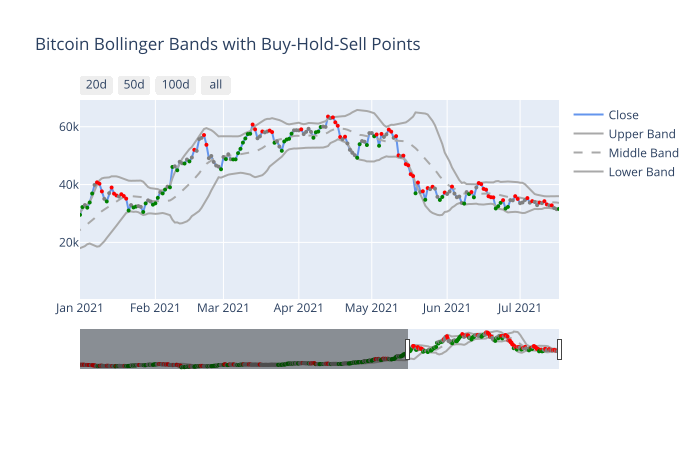

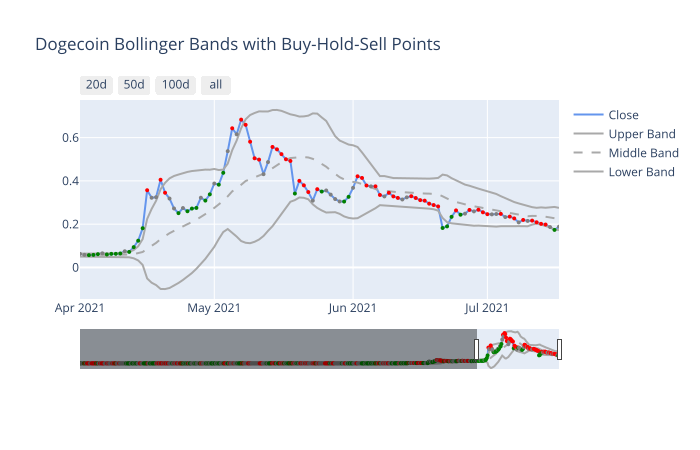

In [9]:
for df in dfs:
    bband_plot(df[0], 20, 0, df[1], renderer)

A bull market will drive the price up to the upper band and it could remain there for a while so not able to firmly develop a strategy to sell when the price breaks the upper band.  When the Close price is straddling the upper band there eventually will be a selloff and the price drops.  Vice versa when the price rides along the lower band it is oversold and people reenter the market and the price rises.  I will engineer a feature that quantifies the current close price with respect to the bollinger upper and lower bands.

#### 2.2.1.2 Moving Averages

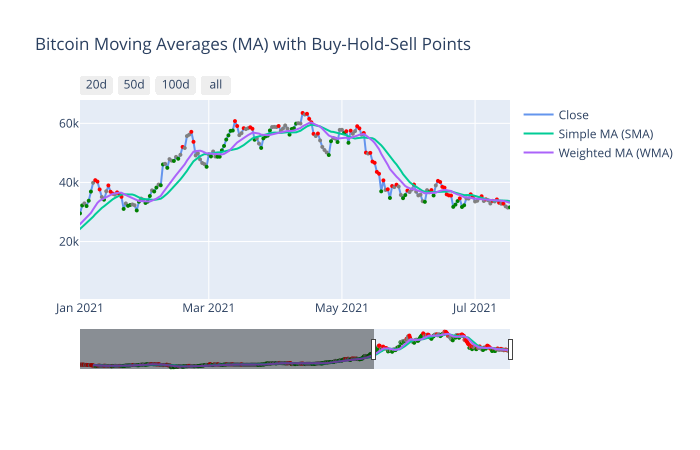

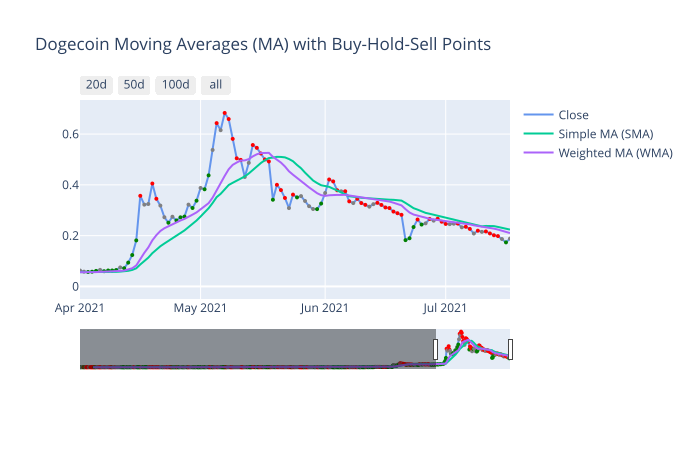

In [10]:
for df in dfs:
    ma_plot(df[0], 20, True, False, df[1], renderer)  

When the WMA crosses above the SMA this is a bullish sign.  Buy at support levels when below the WMA and sell at the resistance levels when above the WMA.

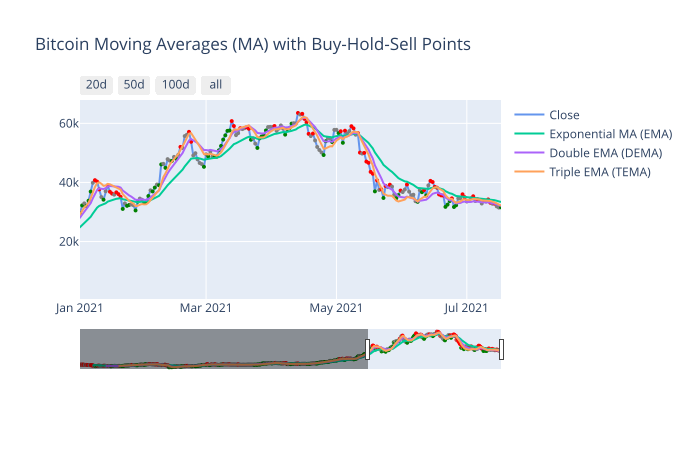

In [11]:
ma_plot(btc, 20, False, True, btc_start_def, renderer)  

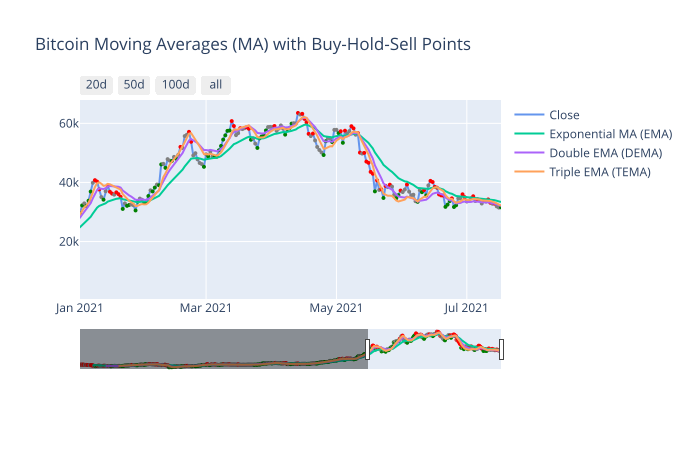

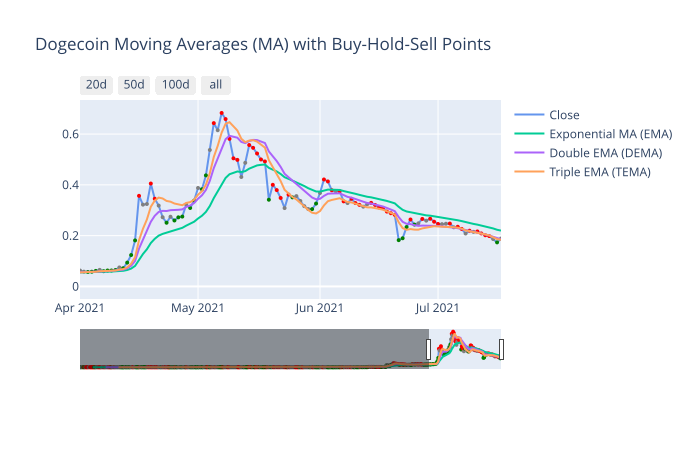

In [12]:
for df in dfs:
    ma_plot(df[0], 20, False, True, df[1], renderer)  

Similar observation for the exponential moving averages.

### 2.2.2 Momentum Indicators

#### 2.2.2.1 MACD

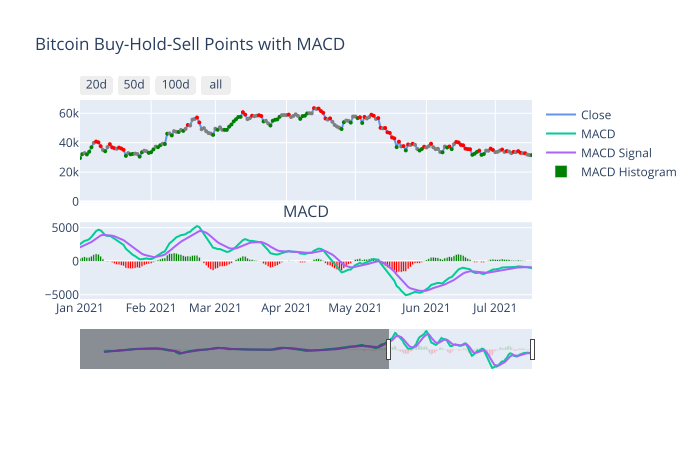

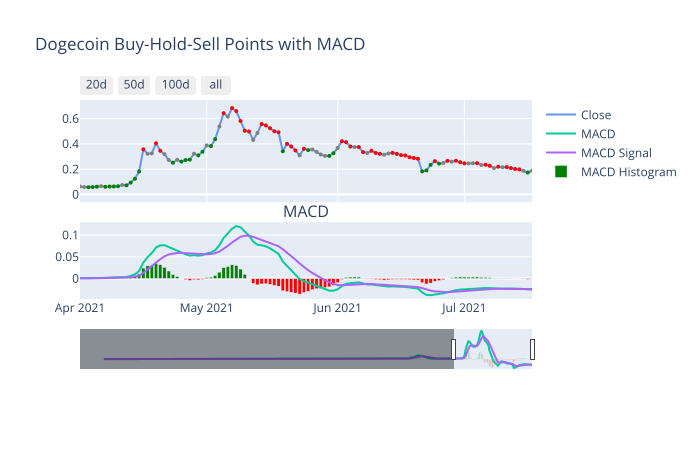

In [13]:
for df in dfs:
    macd_plot(df[0], 12, 26, 9, df[1], renderer)

When the MACD line crosses above the MACD Signal line this is a bullish sign with buy opportunities.  The market will eventually go bearish and drive the MACD back below the Signal from a selloff.

#### 2.2.2.2 RSI

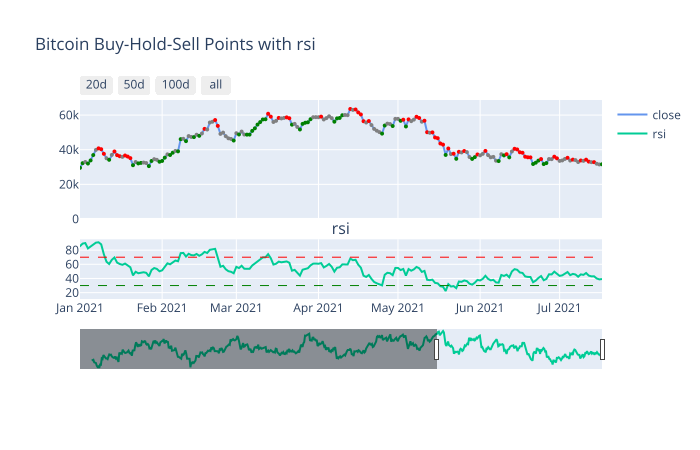

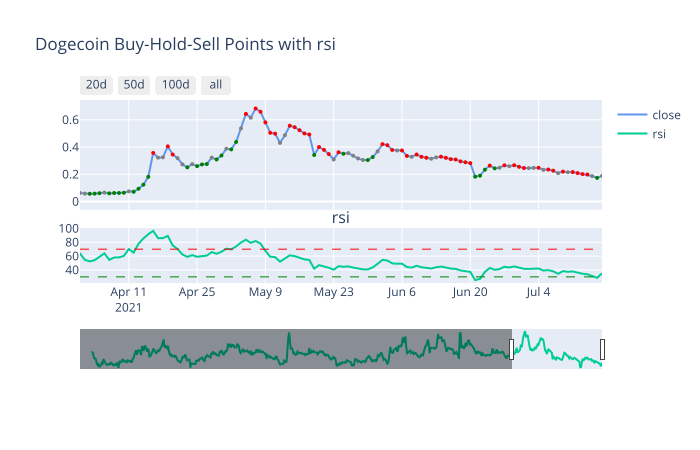

In [14]:
# RSI
custom_params = dict(col='rsi', 
                     sp=dict(timeperiod=14), mp=None,
                     hlines=[dict(y=70, line_width=1, line_dash='dash', line_color='red', row=2), 
                             dict(y=30, line_width=1, line_dash='dash', line_color='green', row=2)])
for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

A common investment strategy is to buy when the RSI goes below 30 and sell above 70.  This pattern holds pretty well although for Bitcoin there are troughs where the market rises well before the RSI reaches 30.

#### 2.2.2.3 All Other Indicators

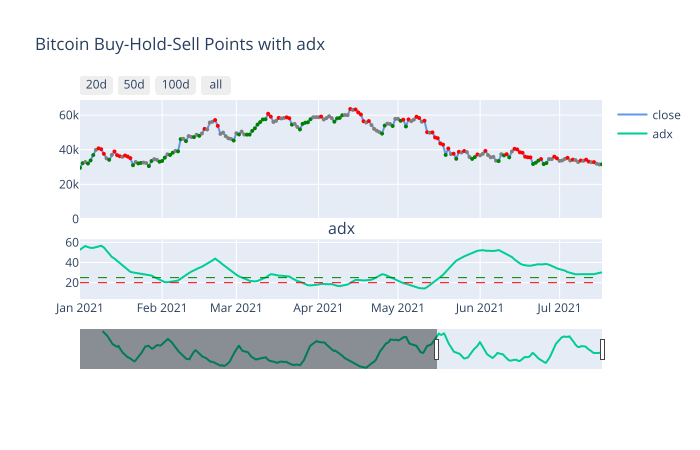

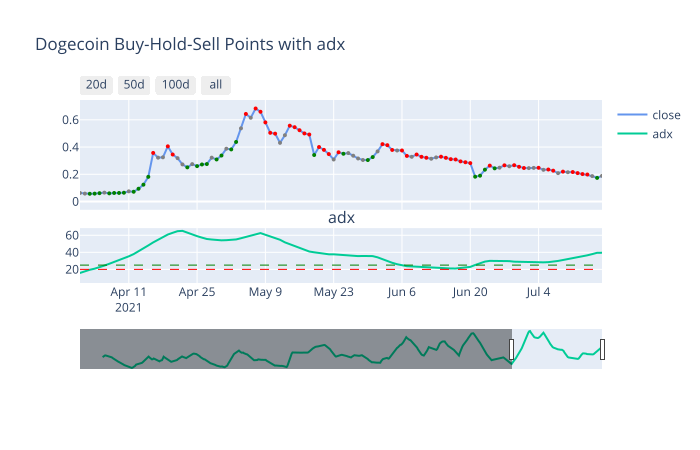

In [15]:
# ADX
custom_params = dict(col='adx',
                     sp=dict(timeperiod=14), mp=None,
                     hlines=[dict(y=25, line_width=1, line_dash='dash', line_color='green', row=2), 
                             dict(y=20, line_width=1, line_dash='dash', line_color='red', row=2)])


for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

ADX can be used to identify a strong trend.  ADX identifies a strong trend when over 25 and weak trend below 20.  Dogecoin is exhibiting very strong trend patterns this year whereas Bitcoin is oscillating.

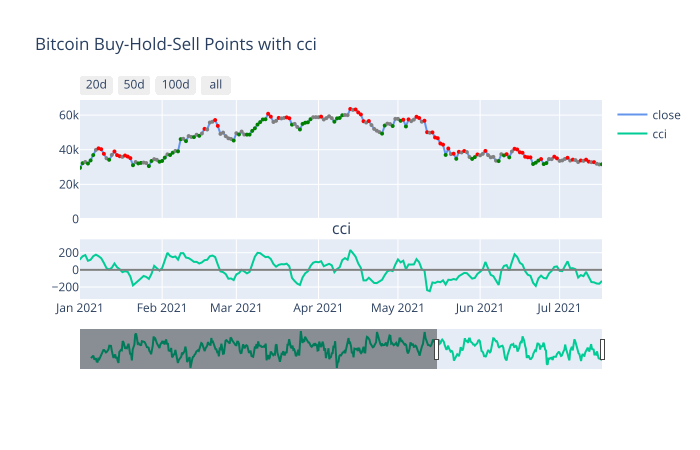

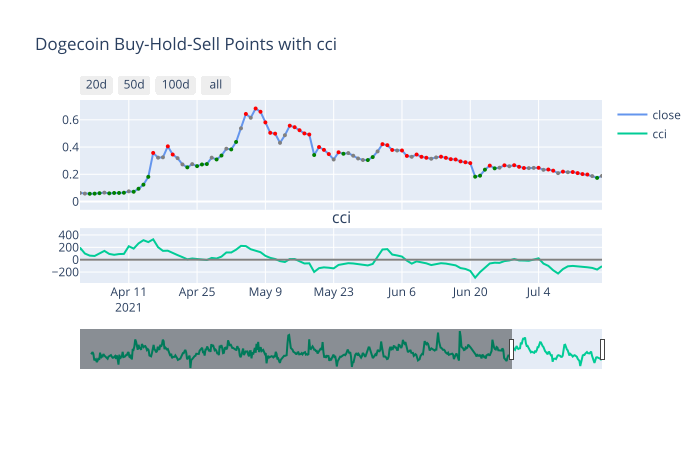

In [16]:
# CCI
custom_params = dict(col='cci',
                     sp=dict(timeperiod=14), mp=None,
                     hlines=[dict(y=0, line_width=2, line_dash='solid', line_color='grey', row=2)])
for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

CCI measures the difference between the current price and historical average price.  CCI may be more effective at identifying good buying opportunities for Bitcoin when CCI is well below zero.

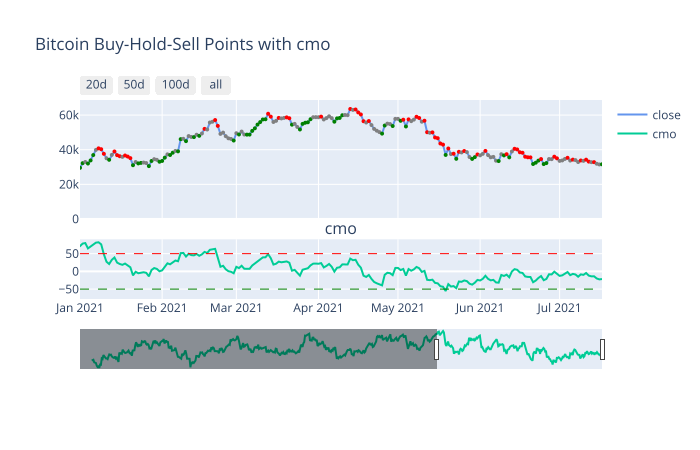

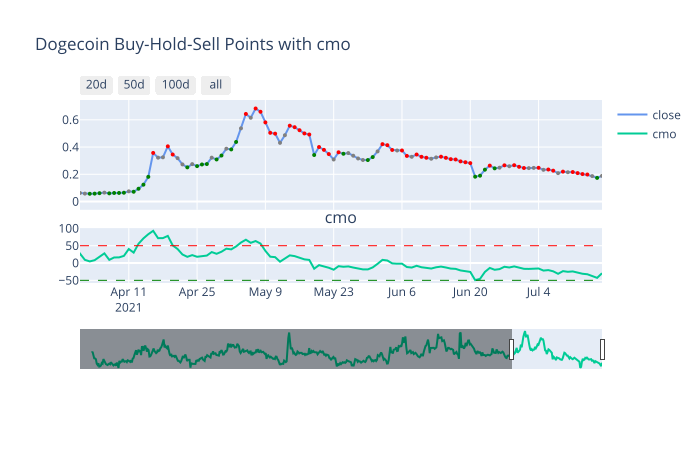

In [17]:
# CMO
custom_params = dict(col='cmo',                     
                     sp=dict(timeperiod=14), mp=None, 
                     hlines=[dict(y=50, line_width=1, line_dash='dash', line_color='red', row=2), 
                             dict(y=-50, line_width=1, line_dash='dash', line_color='green', row=2)])
for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

CMO can be used to identify oversold and overbought levels.  When CMO rises above 50 this is a strong sign the coin is approaching a selling point.

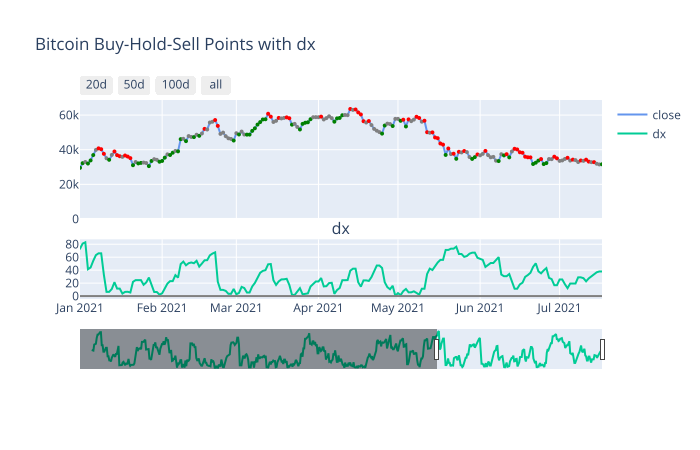

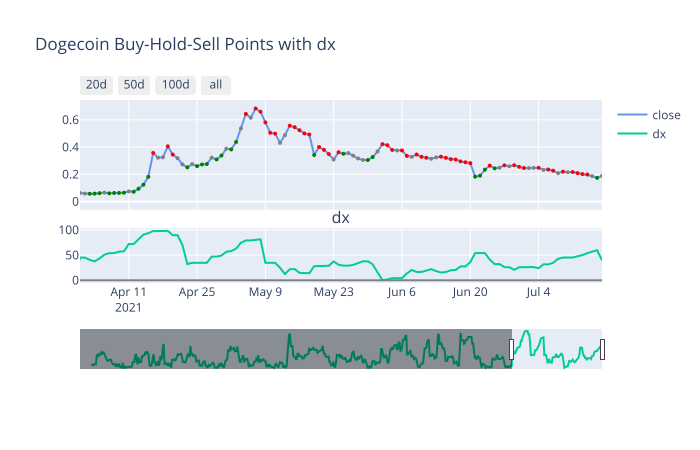

In [18]:
# DX
custom_params = dict(col='dx',                     
                     sp=dict(timeperiod=14), mp=None, 
                     hlines=[dict(y=0, line_width=2, line_dash='solid', line_color='grey', row=2)])
for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

DX can help identify directinal movement of the coin and the strength of a bull or bear market.  The higher the value the stronger the trend.

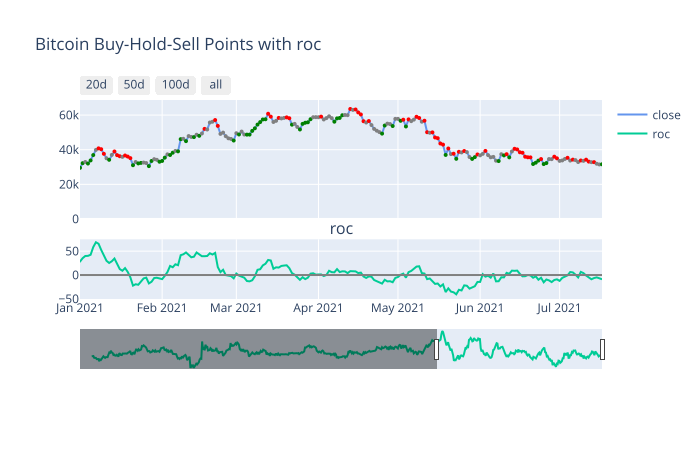

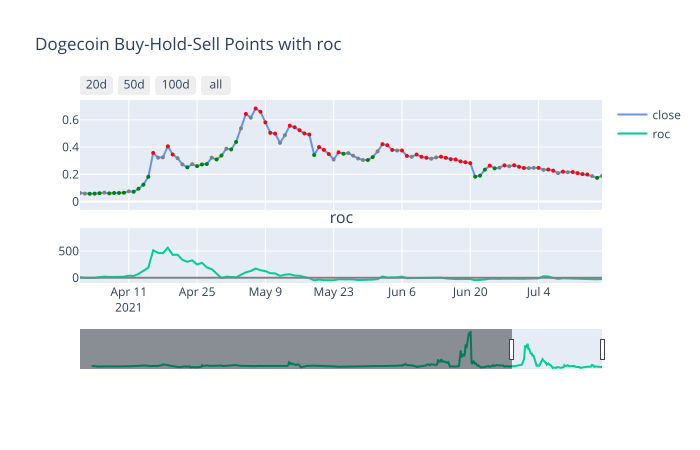

In [19]:
custom_params = dict(col='roc', 
                     sp=dict(timeperiod=14), mp=None,
                     hlines=[dict(y=0, line_width=2, line_dash='solid', line_color='grey', row=2)])
for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

ROC is another momentum indicator above zero indicates an uptrend.  If it hovers near zero it indicates that the price is consolidating.  Bitcoin entered a downtrend in early May 2021 at levels not seen since the start of the pandemic.  Dogecoin has never consistently stayed in a downtrend.

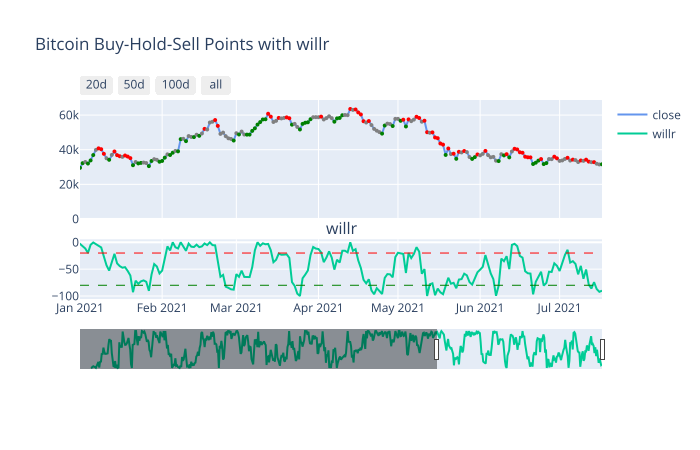

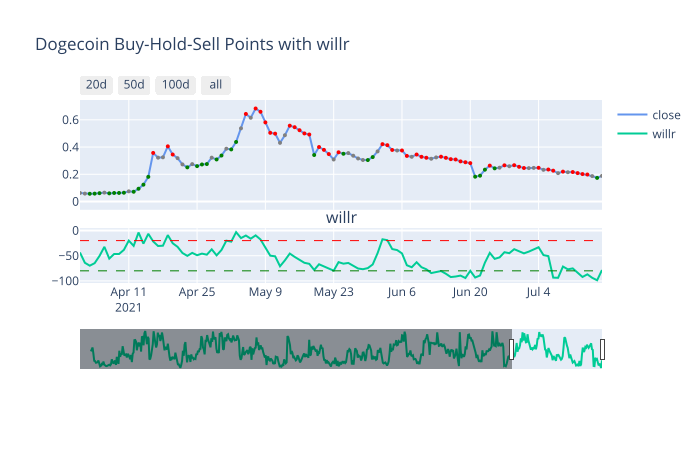

In [20]:
# WILLR
custom_params = dict(col='willr', 
                     sp=dict(timeperiod=14), mp=None,
                     hlines=[dict(y=-20, line_width=1, line_dash='dash', line_color='red', row=2), 
                             dict(y=-80, line_width=1, line_dash='dash', line_color='green', row=2)])
for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

WillR is another momentum indicator that measures overbough and oversold levels.  A reading above -20 can identify overbought conditions and is a good indicator for sell points.  A reading below -80 can identify oversold conditions and is a good indicator for buy points.

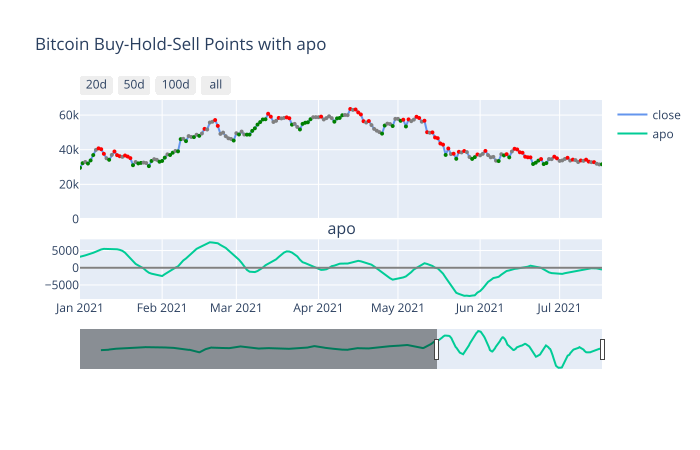

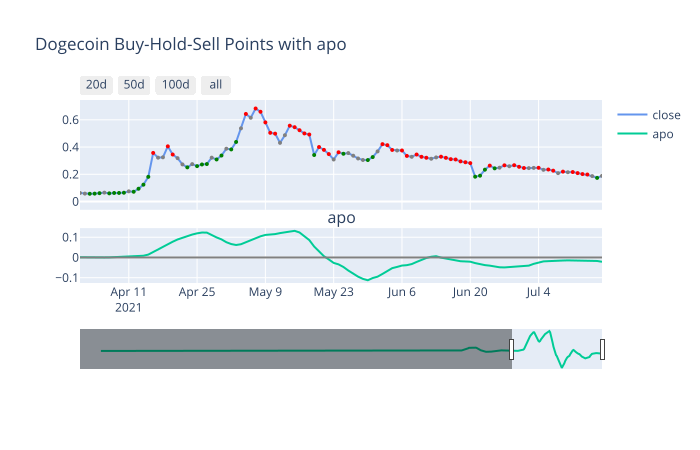

In [21]:
# APO
custom_params = dict(col='apo', 
                     sp=None, mp=dict(fastperiod=12, slowperiod=26, signalperiod=9),
                     hlines=[dict(y=0, line_width=2, line_dash='solid', line_color='grey', row=2)])

for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

APO crossing zero is considered bullish but at the peak is a good indicator for sell points.

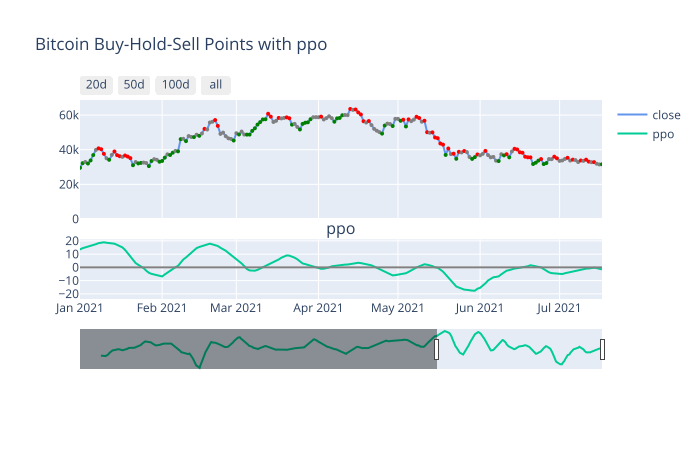

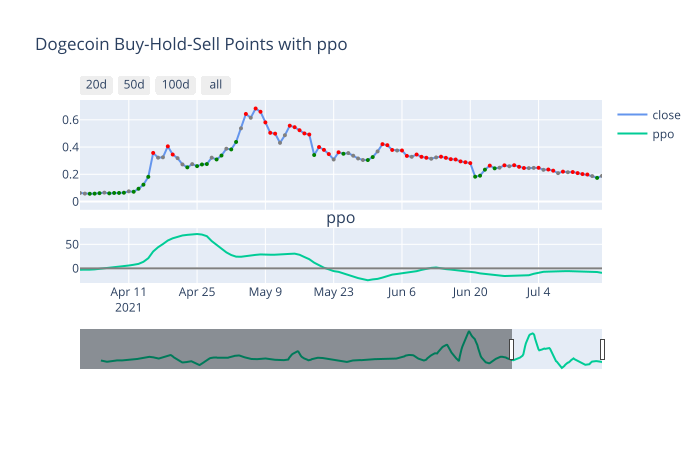

In [22]:
# PPO
custom_params = dict(col='ppo',
                     sp=None, mp=dict(fastperiod=12, slowperiod=26, signalperiod=9),
                     hlines=[dict(y=0, line_width=2, line_dash='solid', line_color='grey', row=2)])

for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

PPO has similar observations to APO and really confirms the bear market for Bitcoin and Dogecoin since late May.

### 2.2.3 Statistics

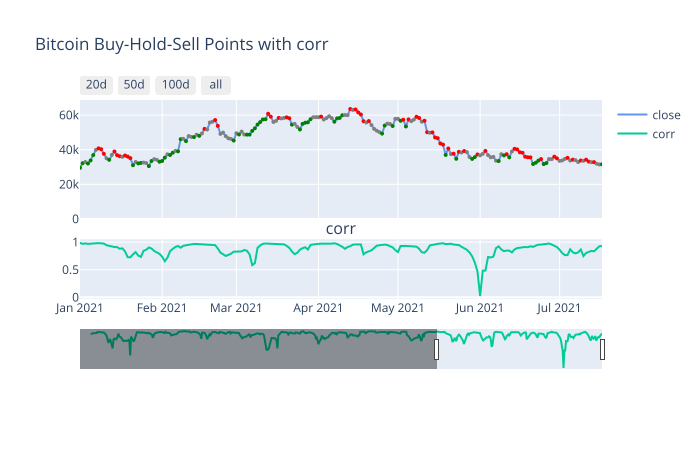

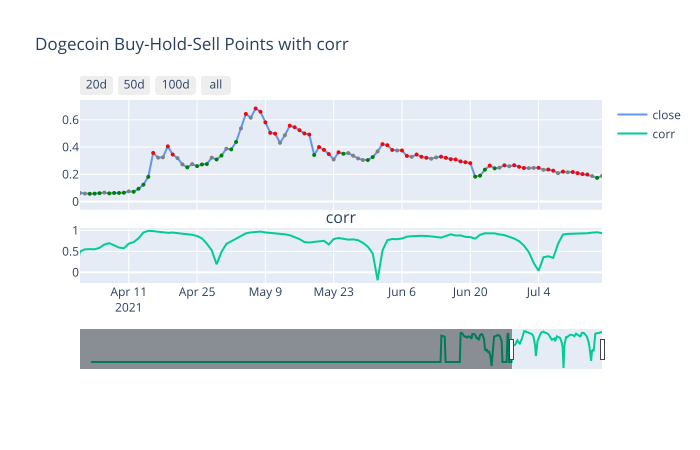

In [23]:
# CORR
custom_params = dict(col='corr', 
                     sp=dict(timeperiod=14), mp=None,
                     hlines=[])

for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

Drops in high/low correlation identifies good buy points.

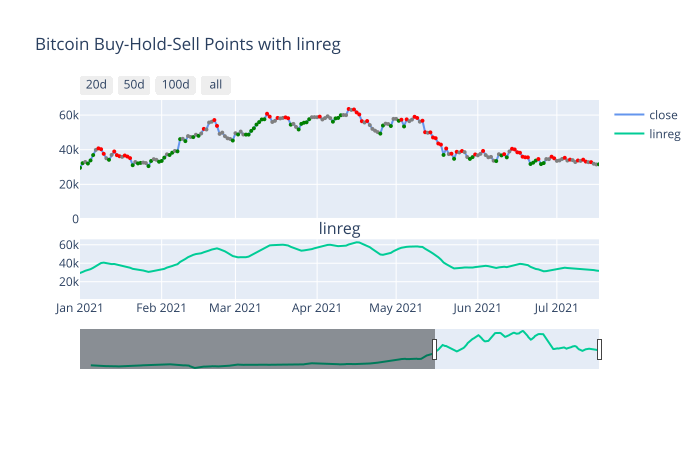

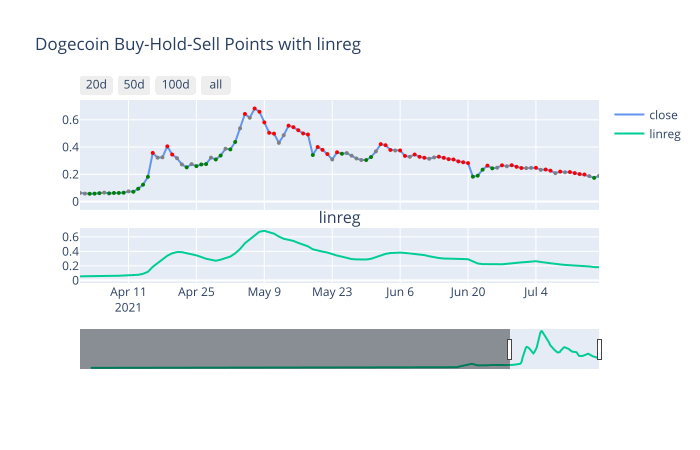

In [24]:
# LINREG
custom_params = dict(col='linreg', 
                     sp=dict(timeperiod=14), mp=None,
                     hlines=[])

for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

Linear Regression can identify directional trends.

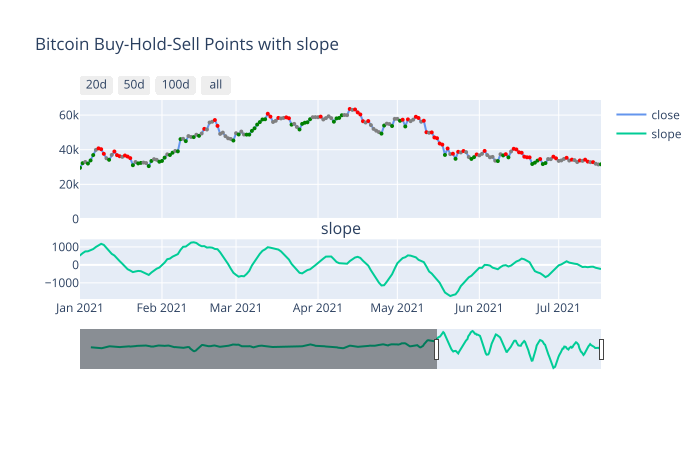

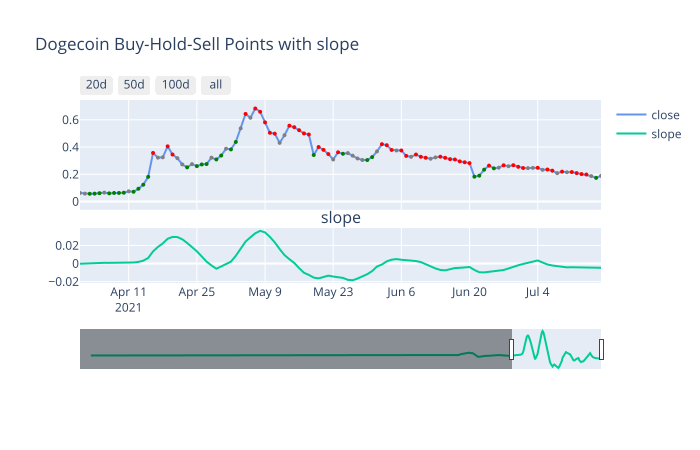

In [25]:
# SLOPE
custom_params = dict(col='slope', 
                     sp=dict(timeperiod=14), mp=None,
                     hlines=[])

for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

Slope can identify the degree of the trend pattern.

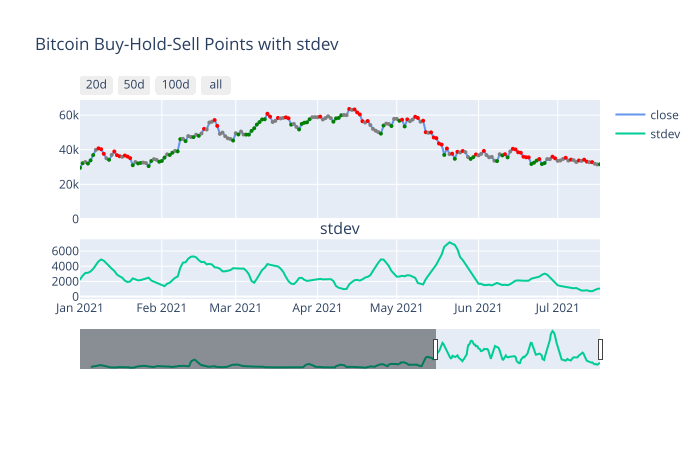

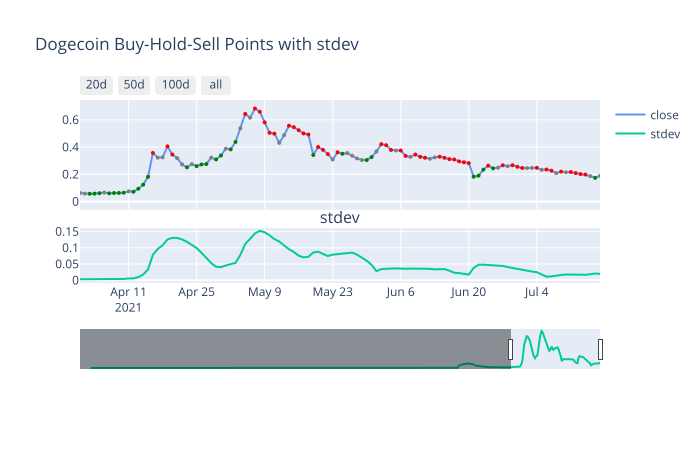

In [26]:
# STDEV
custom_params = dict(col='stdev', 
                     sp=dict(timeperiod=14), mp=None,
                     hlines=[])

for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

High variation can be used to identify sell points.

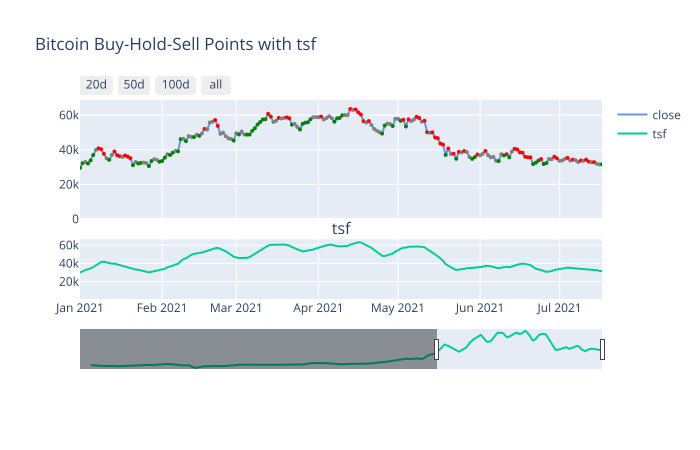

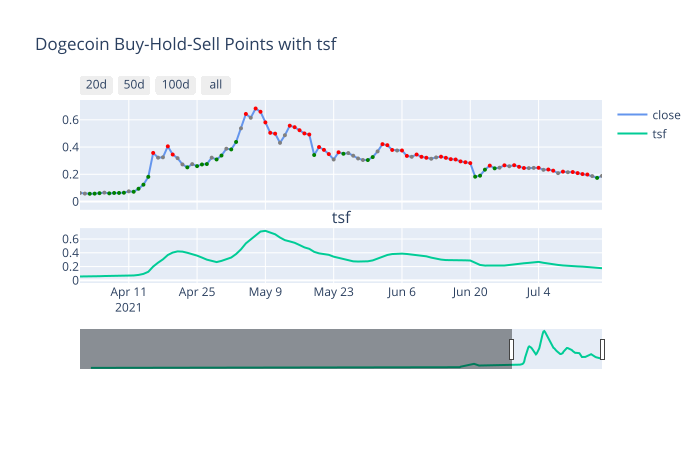

In [27]:
# TSF
custom_params = dict(col='tsf', 
                     sp=dict(timeperiod=14), mp=None,
                     hlines=[])

for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

Time Series Forecast can help with directional trend identification.

## 2.3 Social Analysis

### 2.3.1 Twitter Metrics

In [28]:
# Add social metrics - No custom transformations yet
btc = create_social_metrics(btc, None)
doge = create_social_metrics(doge, None)

# Update dataframes in list
dfs = [[btc, btc_start_def], [doge, doge_start_def]]

In [29]:
# Create list of all Twitter social columns
tweet_cols = ['tweets', 'tweet_spam', 'tweet_followers', 'tweet_quotes', 'tweet_retweets', 
              'tweet_replies', 'tweet_favorites',
              'tweet_sentiment1', 'tweet_sentiment2', 'tweet_sentiment3', 'tweet_sentiment4', 'tweet_sentiment5', 
              'tweet_sentiment_bullish', 'tweet_sentiment_bearish', 'tweet_sentiment_net',
              'tweet_sentiment_impact1', 'tweet_sentiment_impact2', 'tweet_sentiment_impact3',
              'tweet_sentiment_impact4', 'tweet_sentiment_impact5', 
              'tweet_sentiment_impact_bullish', 'tweet_sentiment_impact_bearish', 
              'tweet_sentiment_impact_net', 'sentiment_relative']

#### 2.3.1.1 Global Correlation

##### Pearson

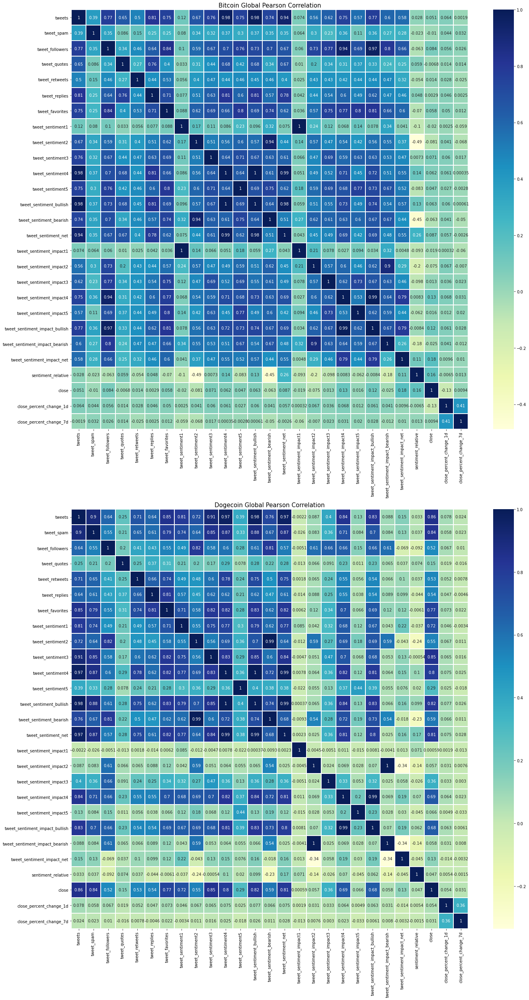

In [30]:
fig, axes = plt.subplots(2, 1, figsize=(20,35))
axes = axes.flatten()

transform_cols = [*tweet_cols, *['close']]
cols = ['close_percent_change_1d', 'close_percent_change_7d']

for i, df in enumerate(dfs):
    global_corr_heatmap(df[0], transform_cols, cols, 'pearson', axes[i])
plt.tight_layout()

For Bitcoin, there is no strong correlation between any of the tweet metrics and close percent change or the forward looking 1 day and 7 day percent changes.  Many of the tweet metrics are also strong correlated with each other which makes sense.  For the tweet metrics I will focus on `tweets` and `tweets_spam` as well as each of the `_sentiment_` metrics.

For Dogecoin, several of tweet metrics have strong correlation with close percent change but are not leading indicators for the forward looking 1 day and 7 day percent changes.

##### Kendall Tau

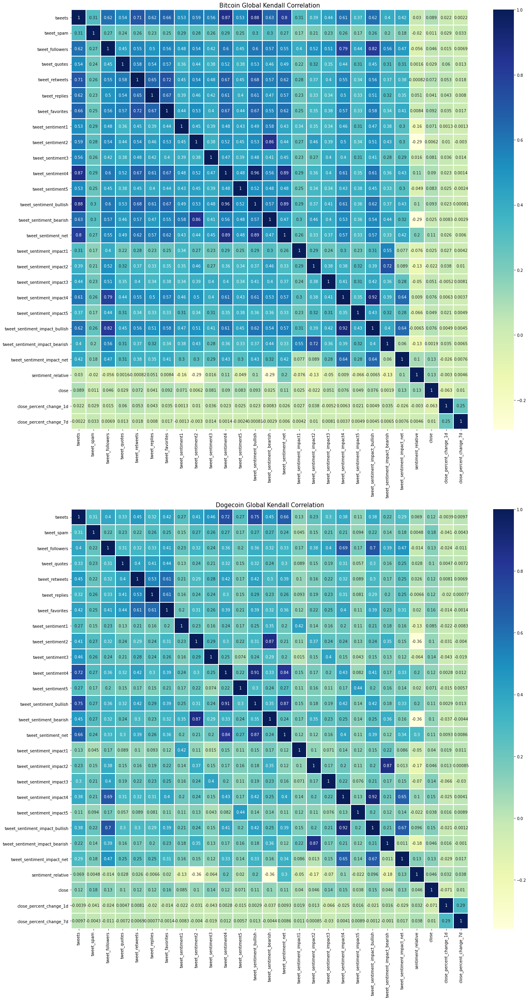

In [31]:
fig, axes = plt.subplots(2, 1, figsize=(20,35))
axes = axes.flatten()

for i, df in enumerate(dfs):
    global_corr_heatmap(df[0], transform_cols, cols, 'kendall', axes[i])
plt.tight_layout()

The Kendall tau statistic is a non-parametric statistical test and meaures ratio of concordant pairs and discordant pairs.  A value close to 1 indicates a high monotonic relationship between the data.

#### 2.3.1.2 Rolling Correlation

Rolling correlation evaluates pearson correlation across a rolling window.  For this analysis I will also apply different transformations including percent change, mean and standard deviation for different windows.

In [32]:
# Set rolling window
window = 14
# Set target column for rolling window correlation analysis
target = 'close_percent_change_7d'

# Create default periods
pct_change_periods = np.arange(1,21,1)
stats_periods = np.arange(2,21,1)

##### Percent Change

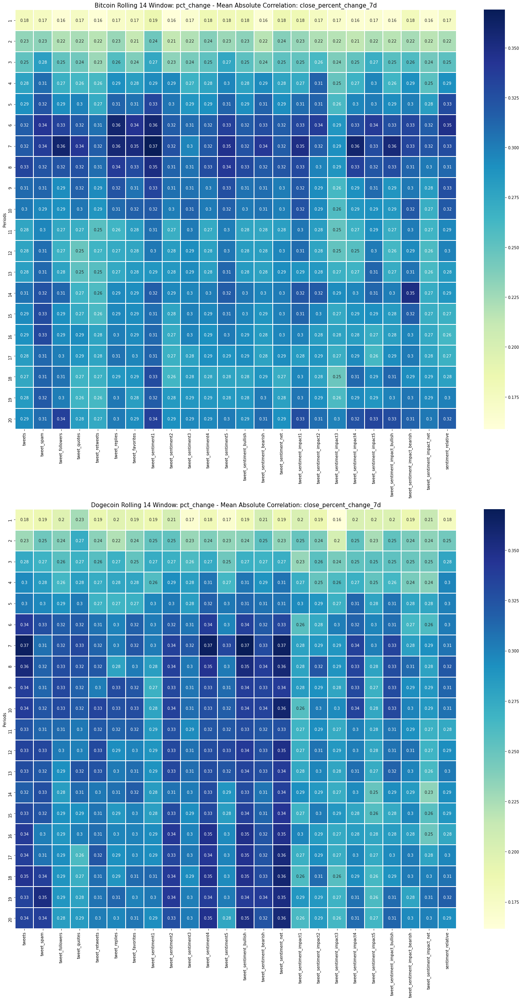

In [33]:
# Percent Change
fig, axes = plt.subplots(2, 1, figsize=(20,35))
axes = axes.flatten()
custom_params = dict(cols=tweet_cols, target=target, transformation='pct_change', window=window, 
                     periods_range=pct_change_periods)
for i, df in enumerate(dfs):
    rolling_corr_heatmap(df[0], custom_params, axes[i])
plt.tight_layout()

##### Mean

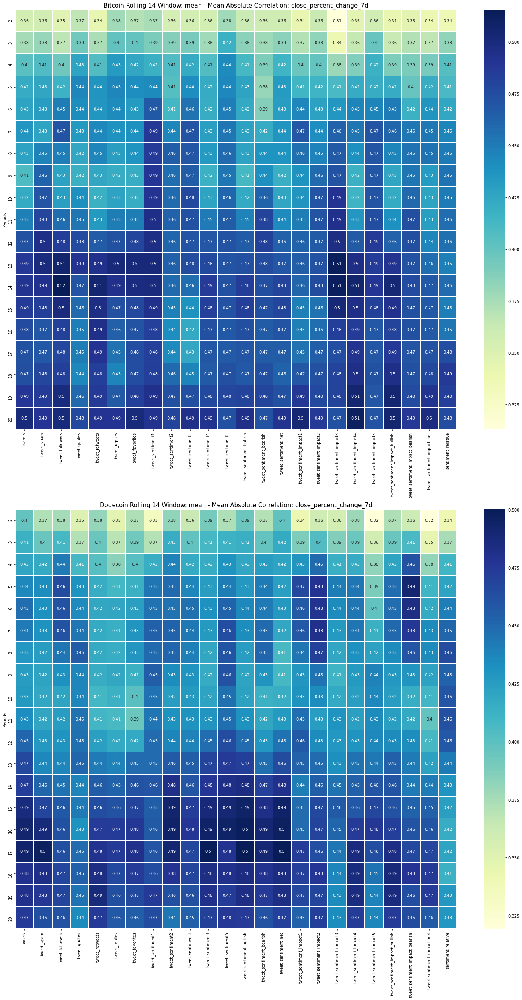

In [34]:
fig, axes = plt.subplots(2, 1, figsize=(20,35))
axes = axes.flatten()
custom_params = dict(cols=tweet_cols, target=target, transformation='mean', window=window, 
                     periods_range=stats_periods)
for i, df in enumerate(dfs):
    rolling_corr_heatmap(df[0], custom_params, axes[i])
plt.tight_layout()

##### Standard Deviation

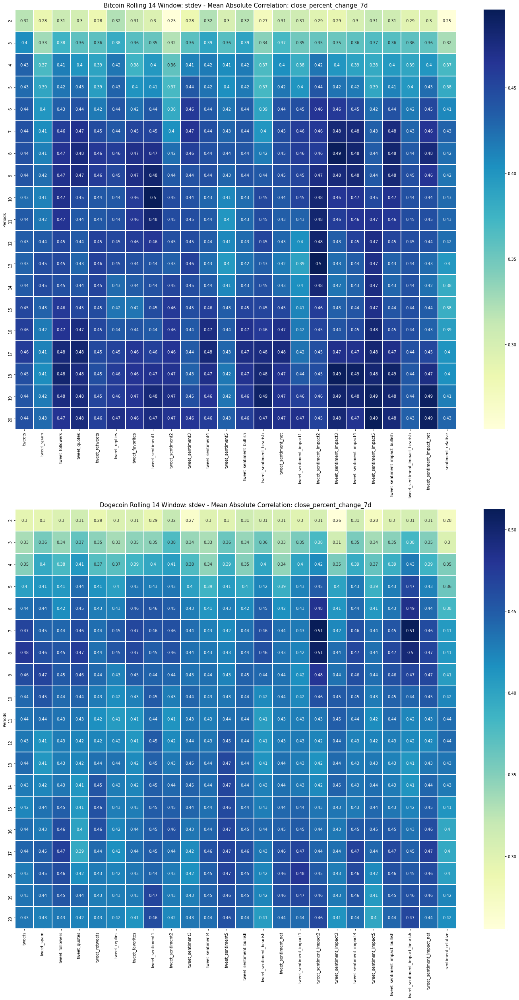

In [35]:
fig, axes = plt.subplots(2, 1, figsize=(20,35))
axes = axes.flatten()
custom_params = dict(cols=tweet_cols, target=target, transformation='stdev', window=window, 
                     periods_range=stats_periods)
for i, df in enumerate(dfs):
    rolling_corr_heatmap(df[0], custom_params, axes[i])
plt.tight_layout()

No Twitter metrics for any pct_change transformation has a mean absolute correlation > 0.36.  Rolling mean and standard deviation for some metrics appears to be the best transformation with several metrics and periods >= 0.5.  In the next section I will visualize the non-transformed metric and rolling correlation over time for select tweet metrics.

#### 2.3.1.3 Tweet Metric Analysis

##### tweets

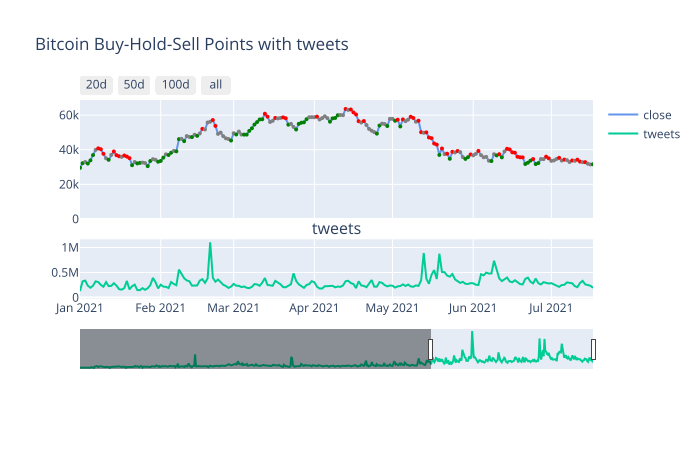

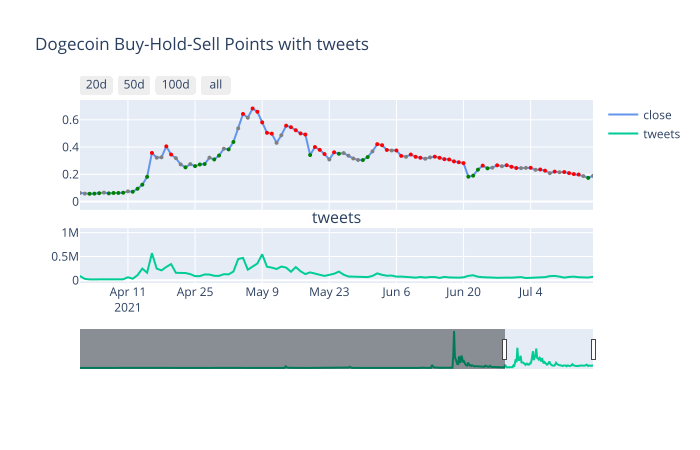

In [36]:
custom_params = dict(col='tweets', sp=None, mp=None, hlines=[])

for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

Large increase in tweet volume coincides with bull market price movement.  For example, Bitcoin tweet volume spiked almost 700k when the price reached 57K on 2/20/21 for the first time.

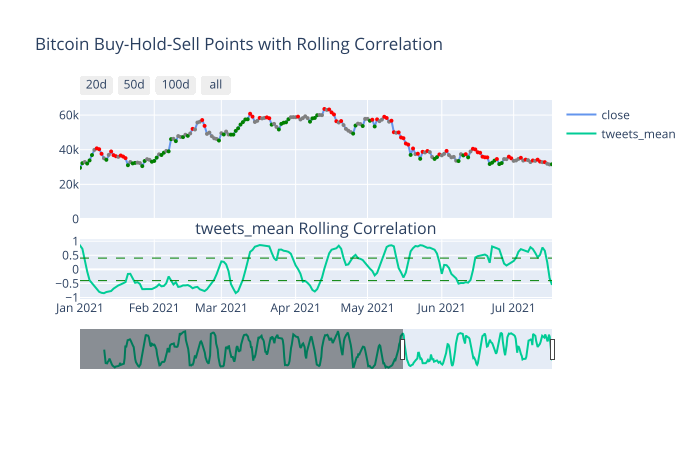

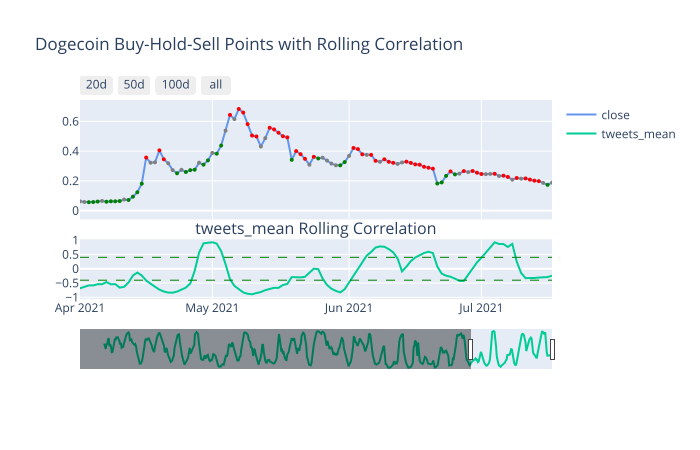

In [37]:
# mean
custom_params = dict(col='tweets', target=target, transformation='mean', window=window, periods=20,
                     hlines=[dict(y=.4, line_width=1, line_dash='dash', line_color='green', row=2), 
                             dict(y=-.4, line_width=1, line_dash='dash', line_color='green', row=2)])

for df in dfs:
    rolling_corr_plot(df[0], custom_params, df[1], renderer)

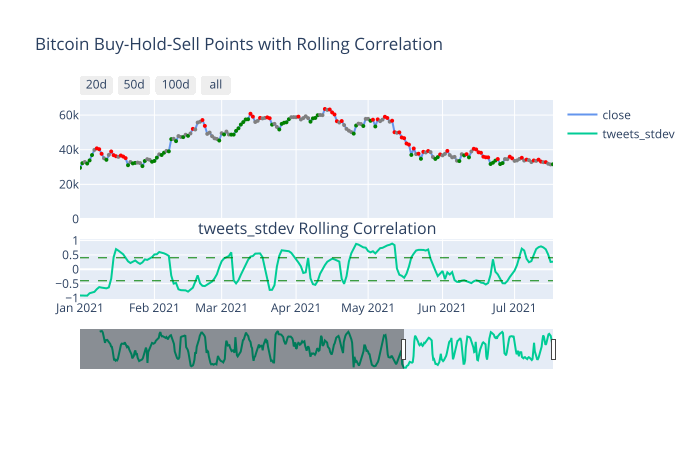

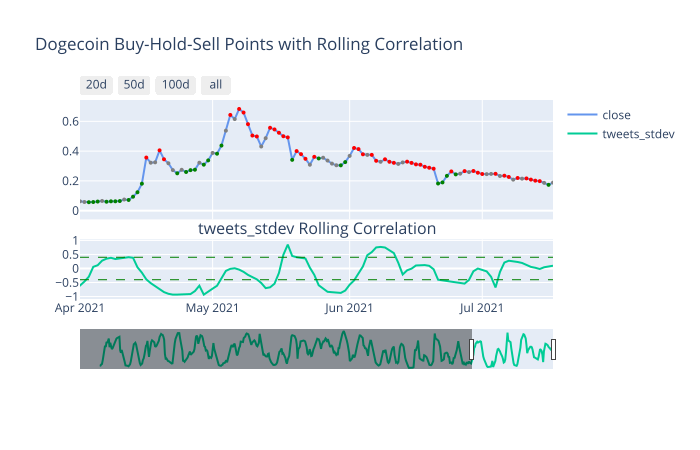

In [38]:
# stdev
custom_params = dict(col='tweets', target=target, transformation='stdev', window=window, periods=14,
                     hlines=[dict(y=.4, line_width=1, line_dash='dash', line_color='green', row=2), 
                             dict(y=-.4, line_width=1, line_dash='dash', line_color='green', row=2)])

for df in dfs:
    rolling_corr_plot(df[0], custom_params, df[1], renderer)

##### tweet_sentiment1

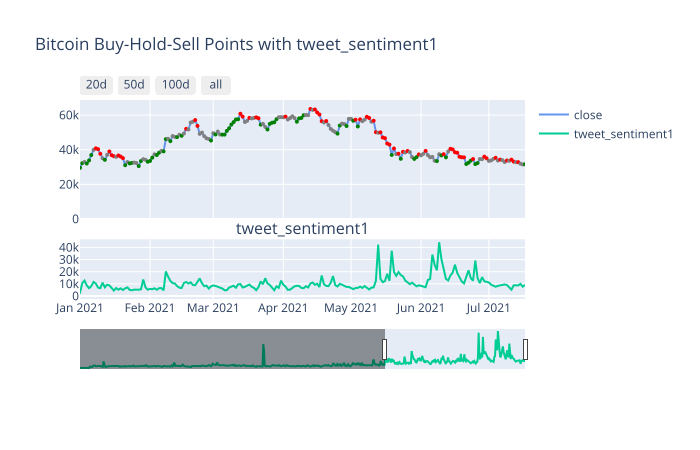

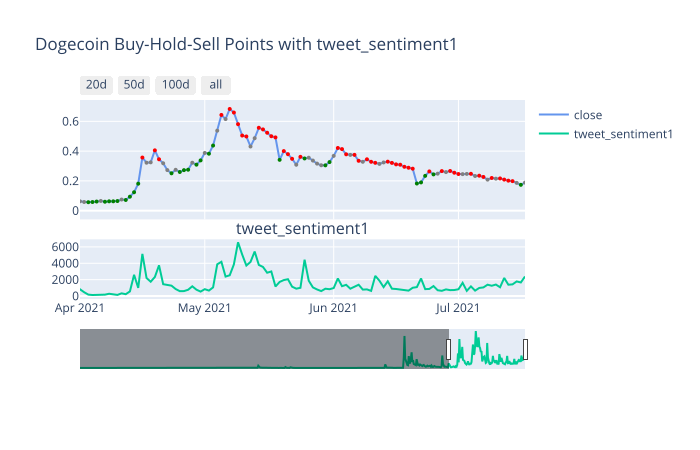

In [39]:
custom_params = dict(col='tweet_sentiment1', sp=None, mp=None, hlines=[])

for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

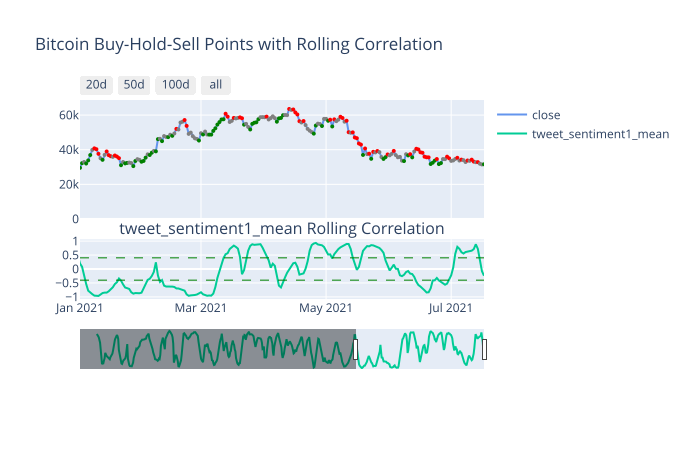

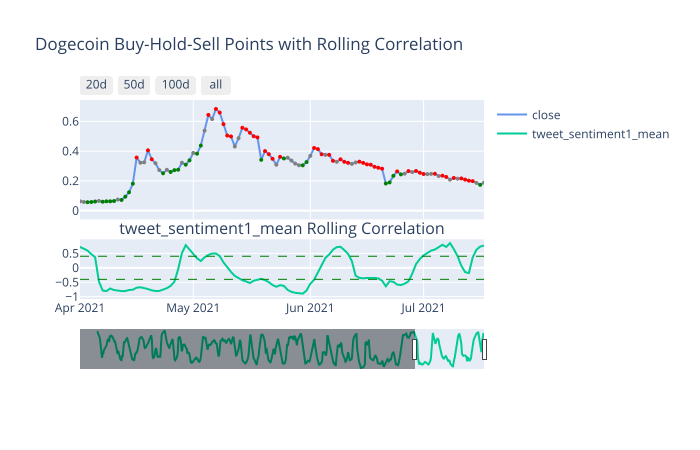

In [40]:
# tweet_sentiment1
custom_params = dict(col='tweet_sentiment1', target=target, transformation='mean', window=window, periods=14,
                     hlines=[dict(y=.4, line_width=1, line_dash='dash', line_color='green', row=2), 
                             dict(y=-.4, line_width=1, line_dash='dash', line_color='green', row=2)])

for df in dfs:
    rolling_corr_plot(df[0], custom_params, df[1], renderer)

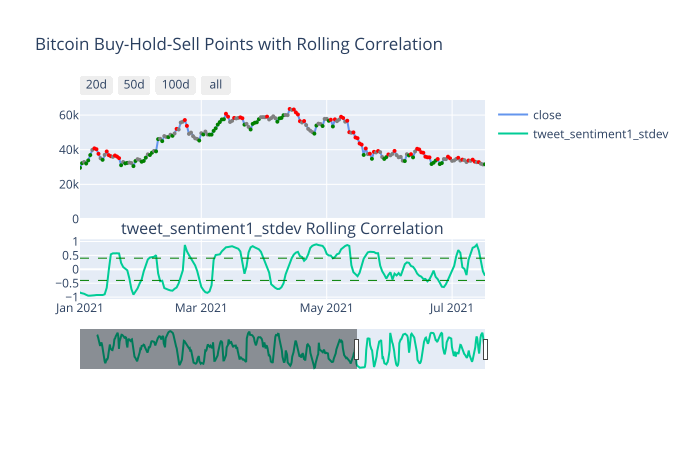

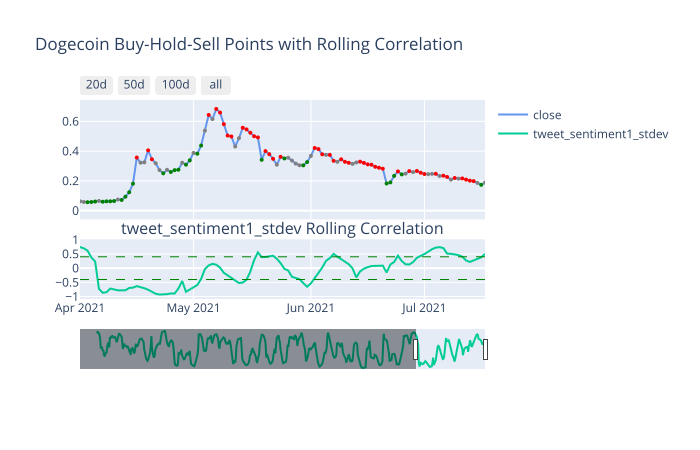

In [41]:
# tweet_sentiment1
custom_params = dict(col='tweet_sentiment1', target=target, transformation='stdev', window=window, periods=14,
                     hlines=[dict(y=.4, line_width=1, line_dash='dash', line_color='green', row=2), 
                             dict(y=-.4, line_width=1, line_dash='dash', line_color='green', row=2)])

for df in dfs:
    rolling_corr_plot(df[0], custom_params, df[1], renderer)

##### tweet_sentiment3

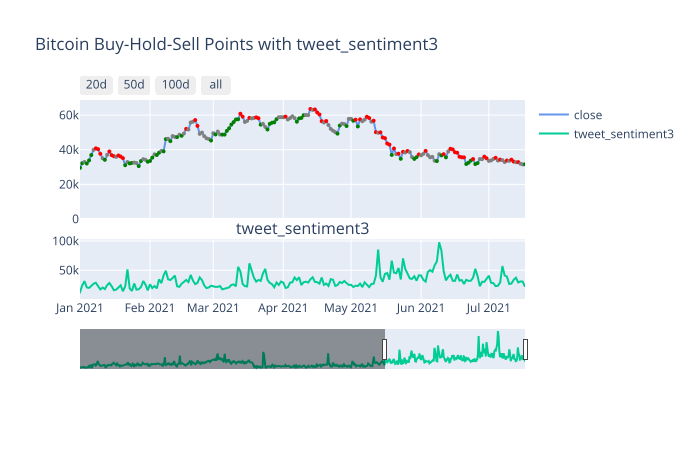

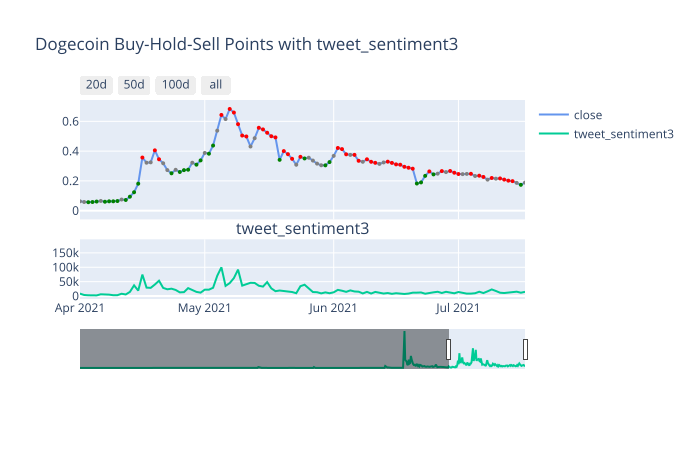

In [42]:
custom_params = dict(col='tweet_sentiment3', sp=None, mp=None, hlines=[])

for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

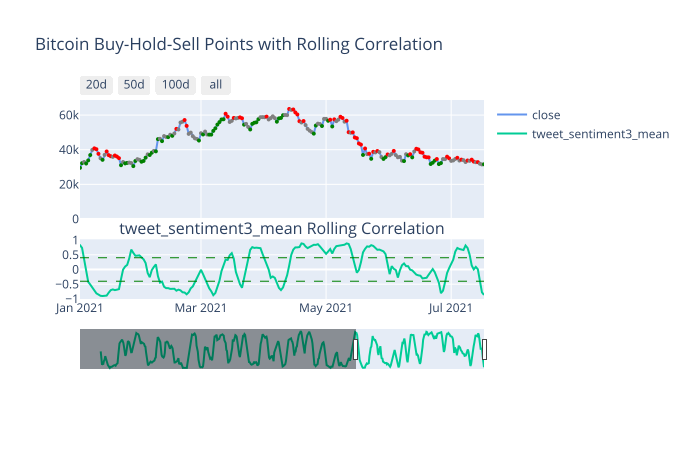

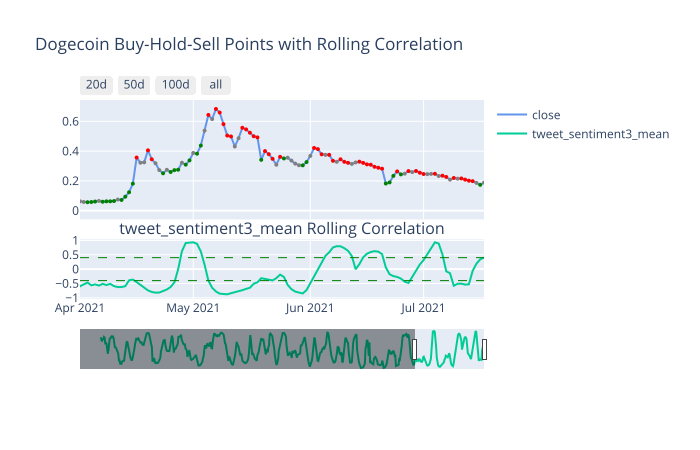

In [43]:
# tweet_sentiment3
custom_params = dict(col='tweet_sentiment3', target=target, transformation='mean', window=window, periods=20,
                     hlines=[dict(y=.4, line_width=1, line_dash='dash', line_color='green', row=2), 
                             dict(y=-.4, line_width=1, line_dash='dash', line_color='green', row=2)])

for df in dfs:
    rolling_corr_plot(df[0], custom_params, df[1], renderer)

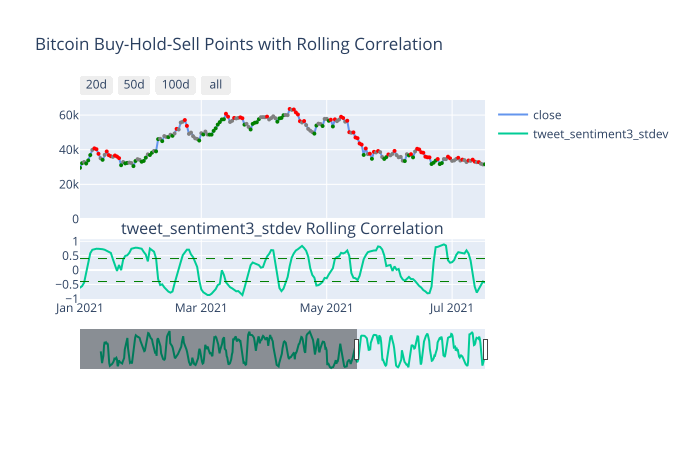

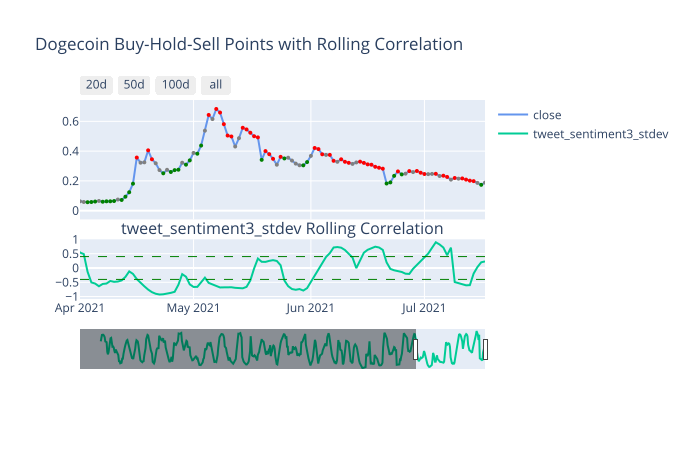

In [44]:
# tweet_sentiment3
custom_params = dict(col='tweet_sentiment3', target=target, transformation='stdev', window=window, periods=20,
                     hlines=[dict(y=.4, line_width=1, line_dash='dash', line_color='green', row=2), 
                             dict(y=-.4, line_width=1, line_dash='dash', line_color='green', row=2)])

for df in dfs:
    rolling_corr_plot(df[0], custom_params, df[1], renderer)

##### tweet_sentiment_impact1

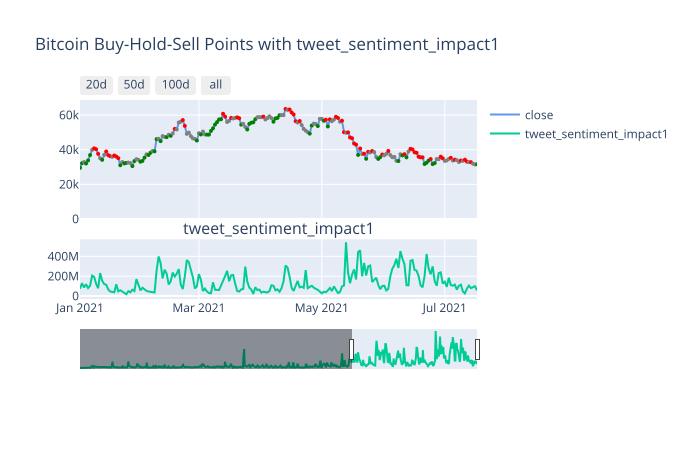

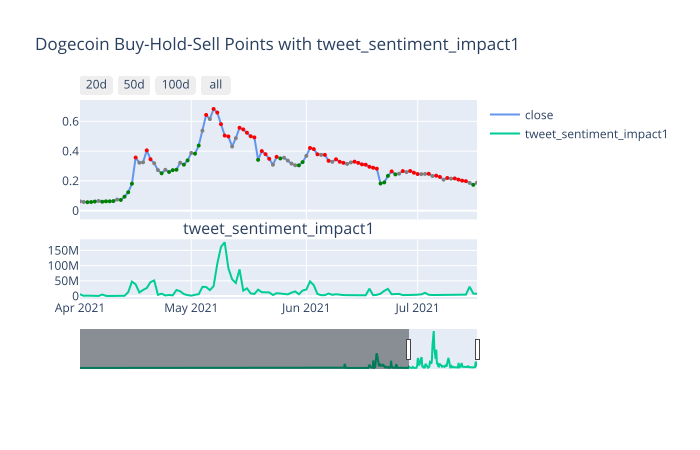

In [45]:
custom_params = dict(col='tweet_sentiment_impact1', sp=None, mp=None, hlines=[])

for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

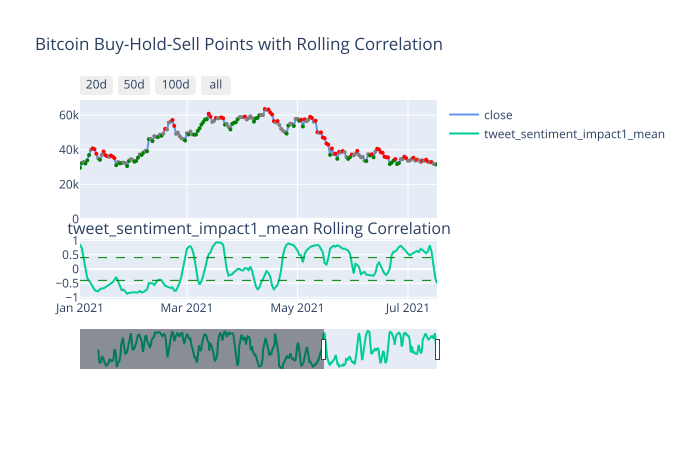

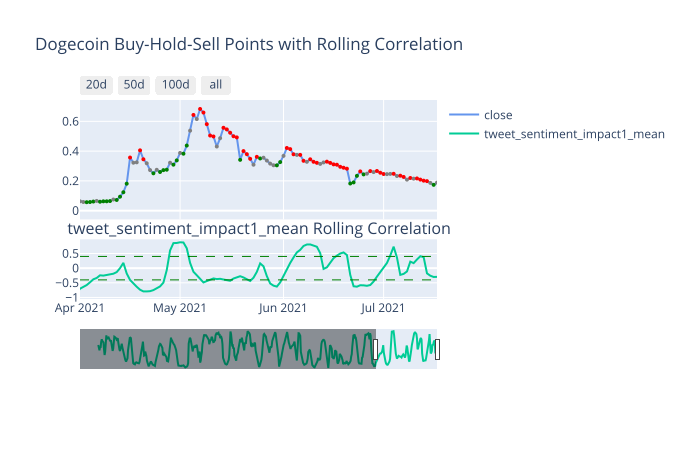

In [46]:
# tweet_sentiment_impact1
custom_params = dict(col='tweet_sentiment_impact1', target=target, transformation='mean', window=window, periods=20,
                     hlines=[dict(y=.4, line_width=1, line_dash='dash', line_color='green', row=2), 
                             dict(y=-.4, line_width=1, line_dash='dash', line_color='green', row=2)])

for df in dfs:
    rolling_corr_plot(df[0], custom_params, df[1], renderer)

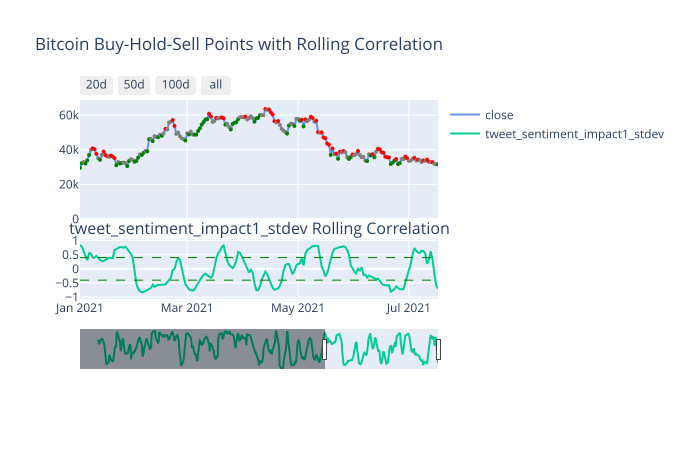

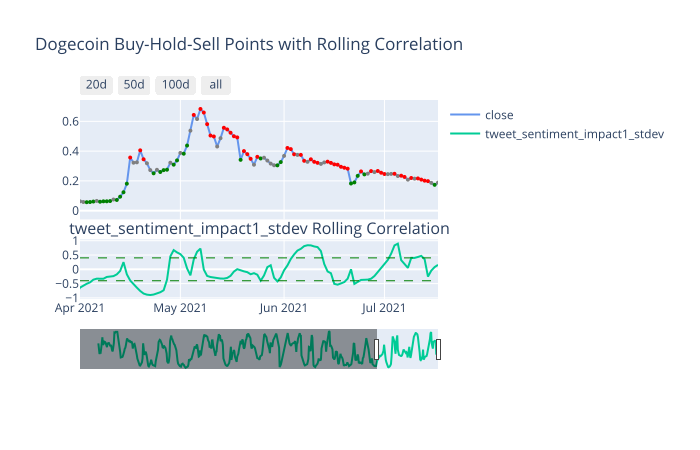

In [47]:
# tweet_sentiment_impact1
custom_params = dict(col='tweet_sentiment_impact1', target=target, transformation='stdev', window=window, periods=20,
                     hlines=[dict(y=.4, line_width=1, line_dash='dash', line_color='green', row=2), 
                             dict(y=-.4, line_width=1, line_dash='dash', line_color='green', row=2)])

for df in dfs:
    rolling_corr_plot(df[0], custom_params, df[1], renderer)

##### tweet_sentiment_impact3

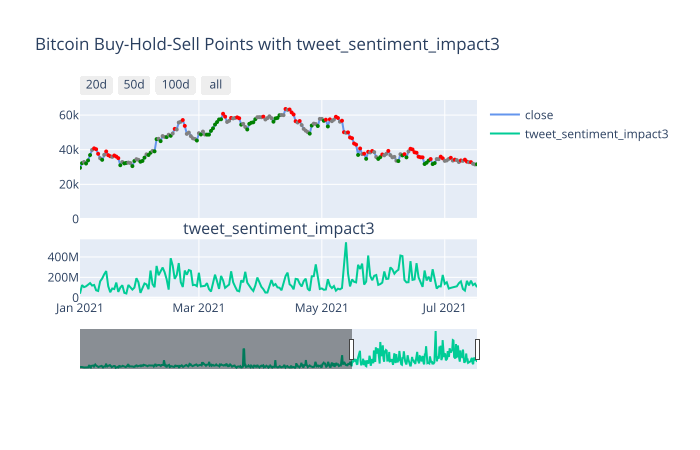

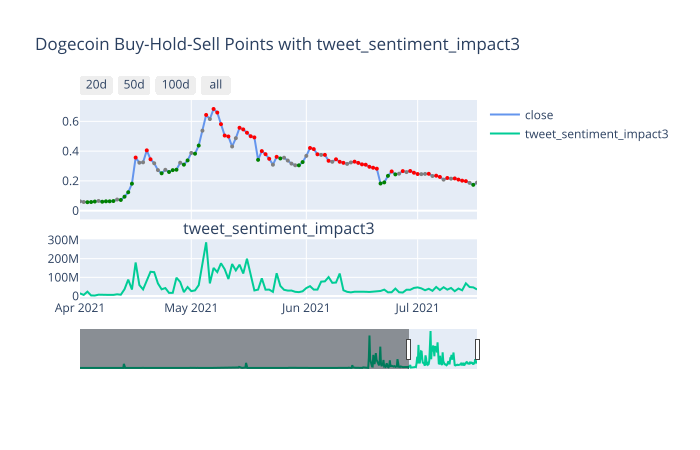

In [48]:
custom_params = dict(col='tweet_sentiment_impact3', sp=None, mp=None, hlines=[])

for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

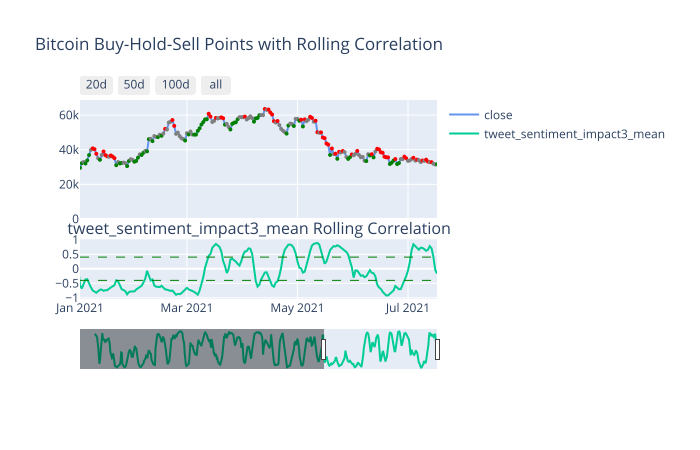

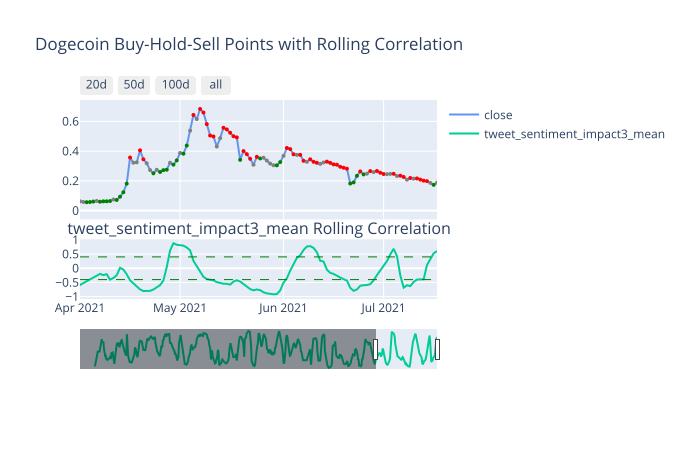

In [49]:
# tweet_sentiment_impact3
custom_params = dict(col='tweet_sentiment_impact3', target=target, transformation='mean', window=window, periods=14,
                     hlines=[dict(y=.4, line_width=1, line_dash='dash', line_color='green', row=2), 
                             dict(y=-.4, line_width=1, line_dash='dash', line_color='green', row=2)])

for df in dfs:
    rolling_corr_plot(df[0], custom_params, df[1], renderer)

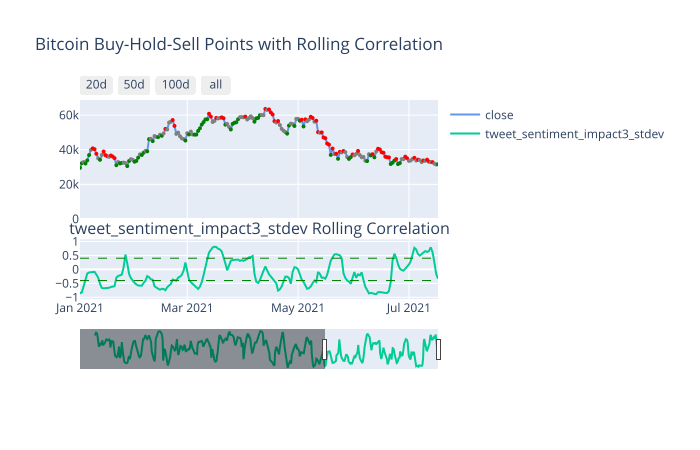

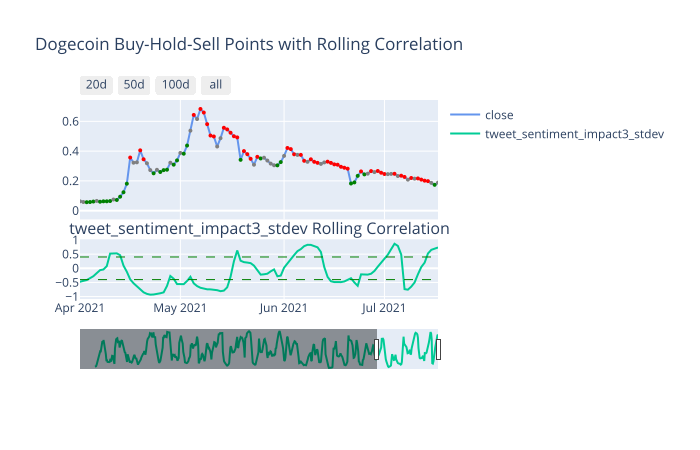

In [50]:
# tweet_sentiment_impact3
custom_params = dict(col='tweet_sentiment_impact3', target=target, transformation='stdev', window=window, periods=14,
                     hlines=[dict(y=.4, line_width=1, line_dash='dash', line_color='green', row=2), 
                             dict(y=-.4, line_width=1, line_dash='dash', line_color='green', row=2)])

for df in dfs:
    rolling_corr_plot(df[0], custom_params, df[1], renderer)

### 2.3.2 Other Social Metrics

In [51]:
# Create list of all non-Twitter social columns
other_social_cols = ['url_shares', 'unique_url_shares', 
                     'reddit_posts', 'reddit_posts_score', 'reddit_comments', 'reddit_comments_score',
                     'social_score', 'news', 'price_score',
                     'social_impact_score', 'correlation_rank', 'galaxy_score', 'volatility',
                     #'market_cap_rank', 'percent_change_24h_rank', 'volume_24h_rank', 
                     #'social_volume_24h_rank','social_score_24h_rank', 
                     'social_contributors', 'social_volume', 'social_volume_global',
                     'market_cap_global', 'market_dominance']

#### 2.3.2.1 Global Correlation

##### Pearson

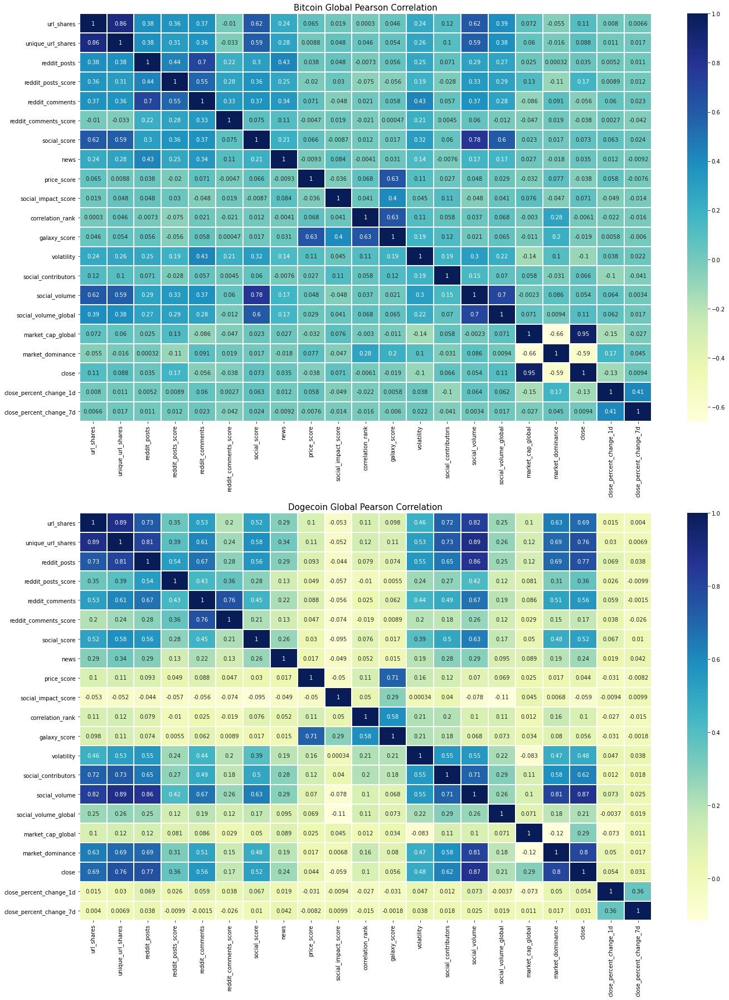

In [52]:
fig, axes = plt.subplots(2, 1, figsize=(20,25))
axes = axes.flatten()

transform_cols = [*other_social_cols, *['close']]
cols = ['close_percent_change_1d', 'close_percent_change_7d']

for i, df in enumerate(dfs):
    global_corr_heatmap(df[0], transform_cols, cols, 'pearson', axes[i])
plt.tight_layout()

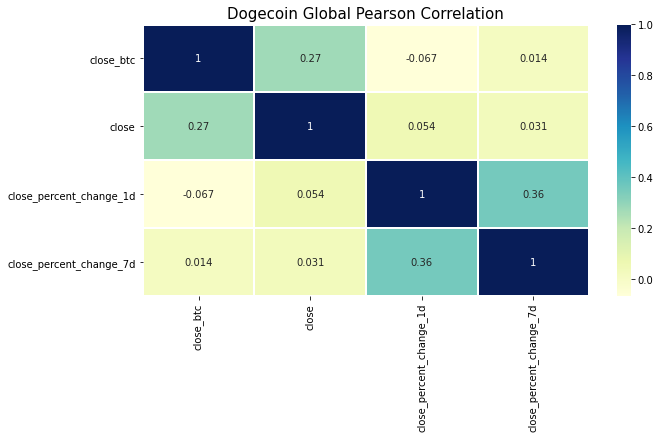

In [53]:
fig, ax = plt.subplots(figsize=(10,5))

transform_cols_doge = [*['close_btc'], *['close']]
cols = ['close_percent_change_1d', 'close_percent_change_7d']

global_corr_heatmap(doge, transform_cols_doge, cols, 'pearson', ax)

##### Kendall Tau

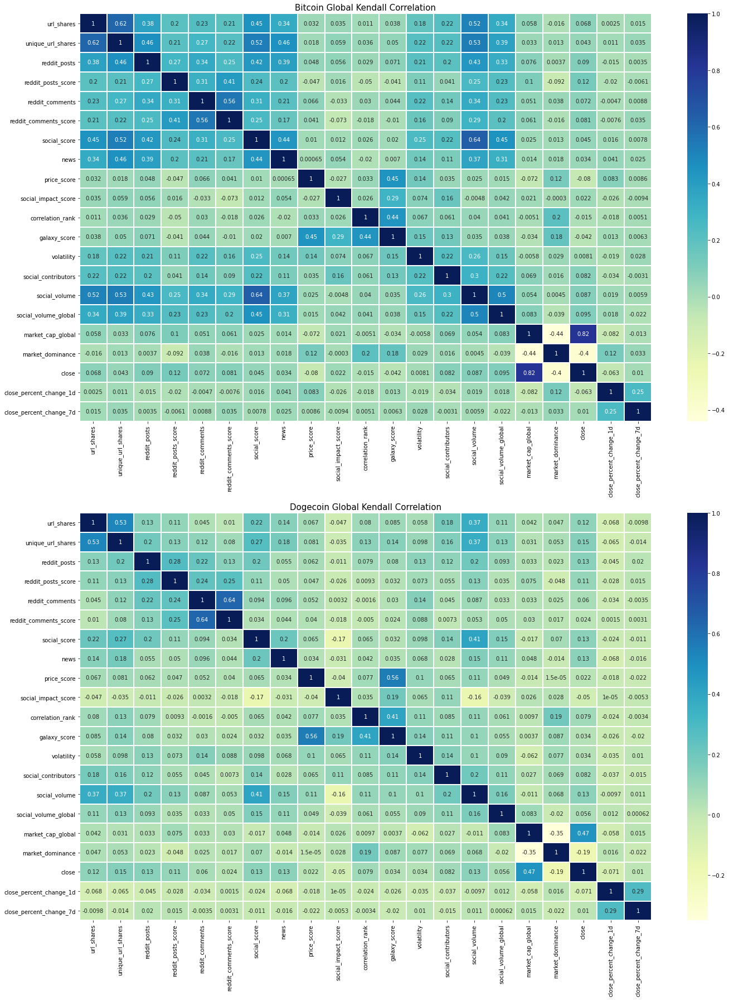

In [54]:
fig, axes = plt.subplots(2, 1, figsize=(20,25))
axes = axes.flatten()

for i, df in enumerate(dfs):
    global_corr_heatmap(df[0], transform_cols, cols, 'kendall', axes[i])
plt.tight_layout()

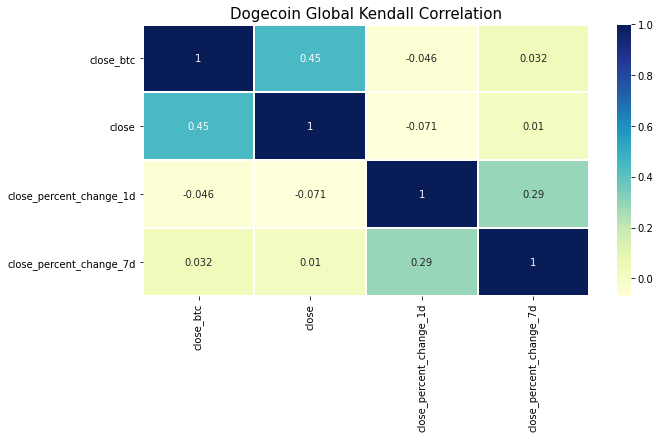

In [55]:
fig, ax = plt.subplots(figsize=(10,5))

global_corr_heatmap(doge, transform_cols_doge, cols, 'kendall', ax)

#### 2.3.2.2 Rolling Correlation

##### Percent Change

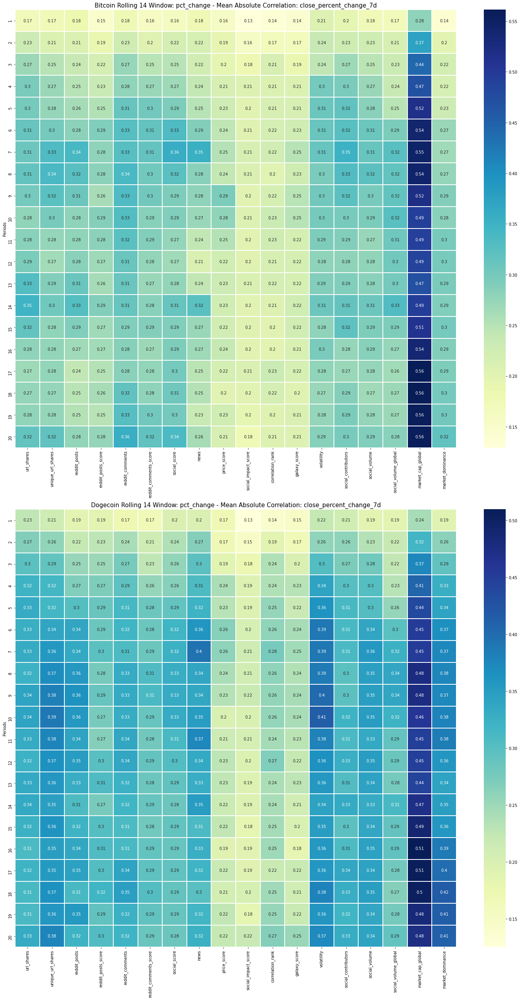

In [56]:
fig, axes = plt.subplots(2, 1, figsize=(20,35))
axes = axes.flatten()
custom_params = dict(cols=other_social_cols, target=target, transformation='pct_change', window=window, 
                     periods_range=pct_change_periods)
for i, df in enumerate(dfs):
    rolling_corr_heatmap(df[0], custom_params, axes[i])
plt.tight_layout()

##### Mean

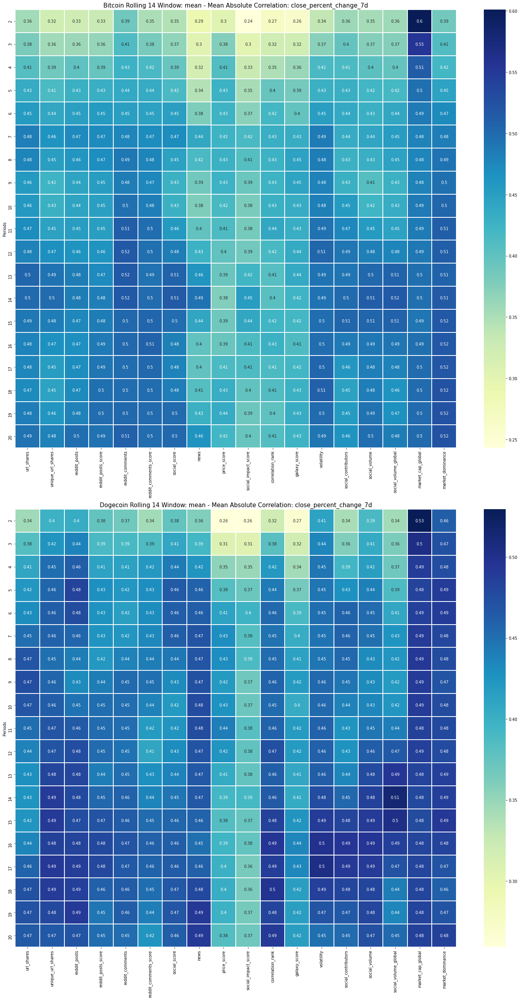

In [57]:
fig, axes = plt.subplots(2, 1, figsize=(20,35))
axes = axes.flatten()
custom_params = dict(cols=other_social_cols, target=target, transformation='mean', window=window, 
                     periods_range=stats_periods)
for i, df in enumerate(dfs):
    rolling_corr_heatmap(df[0], custom_params, axes[i])
plt.tight_layout()

##### Standard Deviation

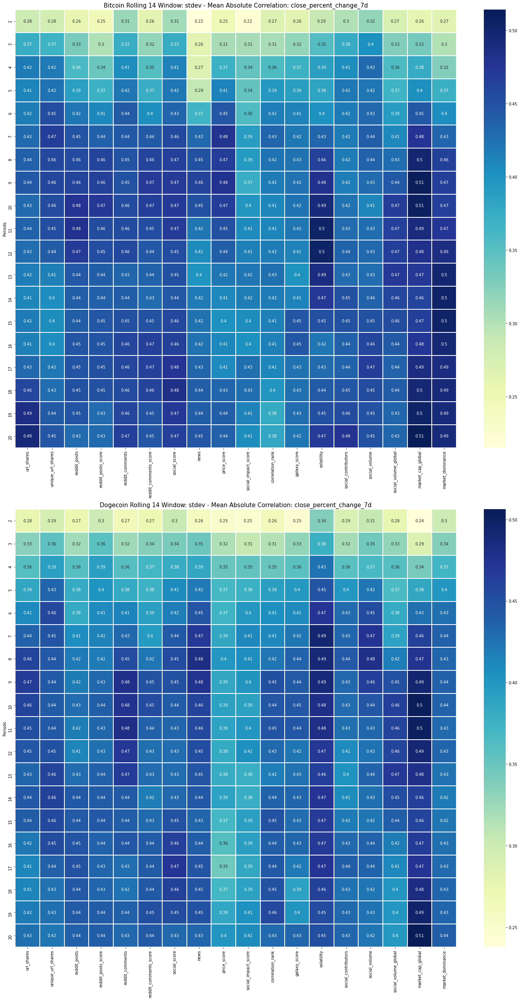

In [58]:
fig, axes = plt.subplots(2, 1, figsize=(20,35))
axes = axes.flatten()
custom_params = dict(cols=other_social_cols, target=target, transformation='stdev', window=window, 
                     periods_range=stats_periods)
for i, df in enumerate(dfs):
    rolling_corr_heatmap(df[0], custom_params, axes[i])
plt.tight_layout()

Similar to Twitter metrics, rolling mean appears to be the best transformation with several metrics and periods >= 0.5.  In the next section I will visualize the rolling correlation over time for several metrics.

#### 2.3.2.3 Other Metric Analysis

##### news

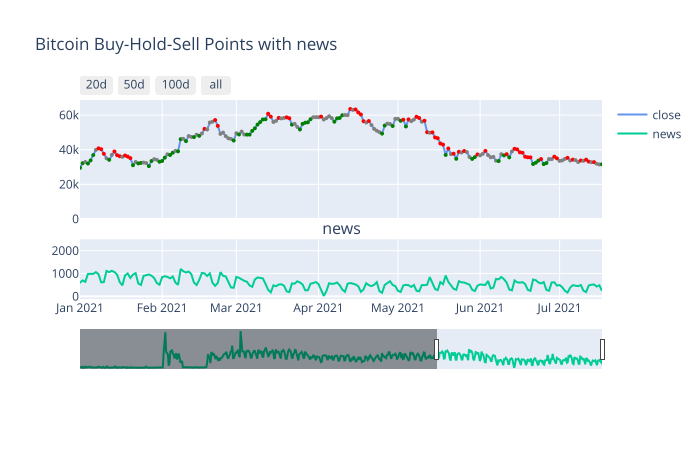

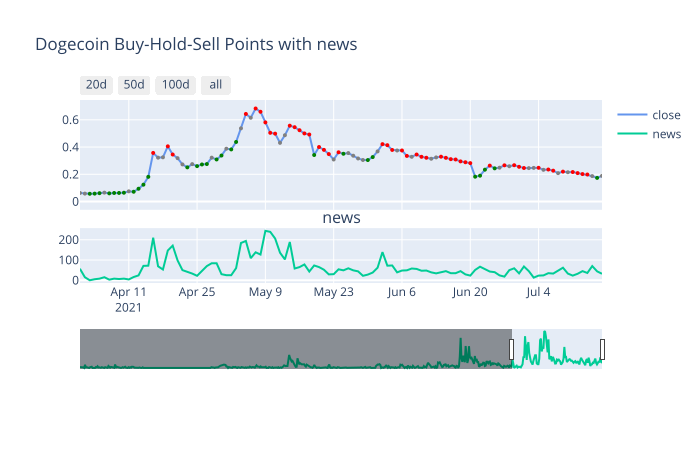

In [59]:
custom_params = dict(col='news', sp=None, mp=None, hlines=[])

for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

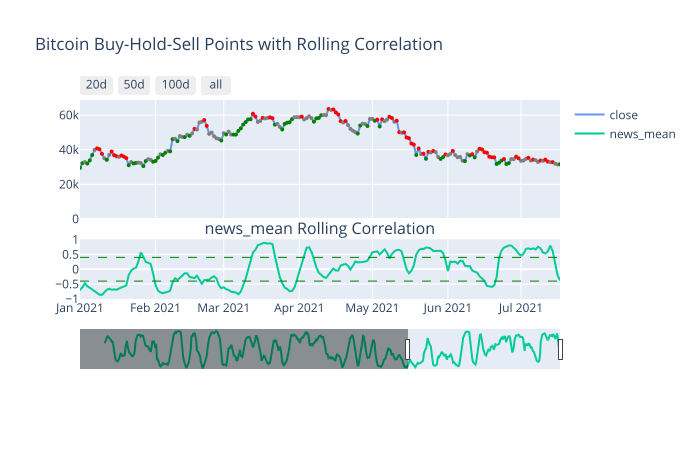

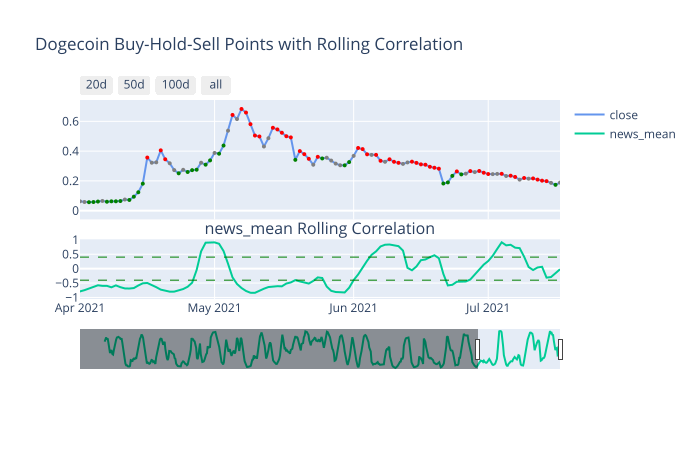

In [60]:
custom_params = dict(col='news', target=target, transformation='mean', window=window, periods=20,
                     hlines=[dict(y=.4, line_width=1, line_dash='dash', line_color='green', row=2), 
                             dict(y=-.4, line_width=1, line_dash='dash', line_color='green', row=2)])

for df in dfs:
    rolling_corr_plot(df[0], custom_params, df[1], renderer)

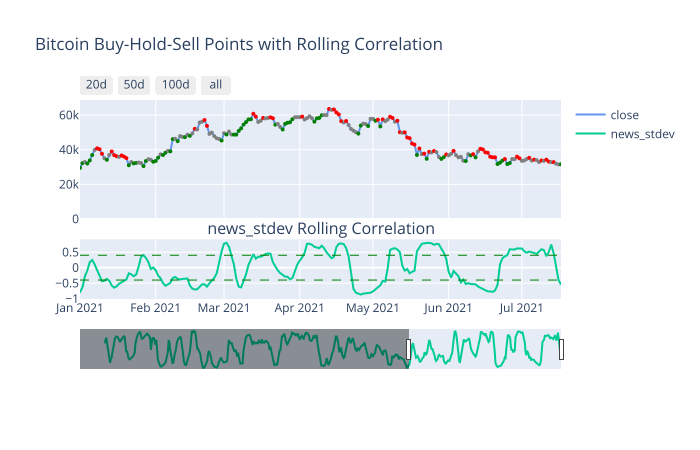

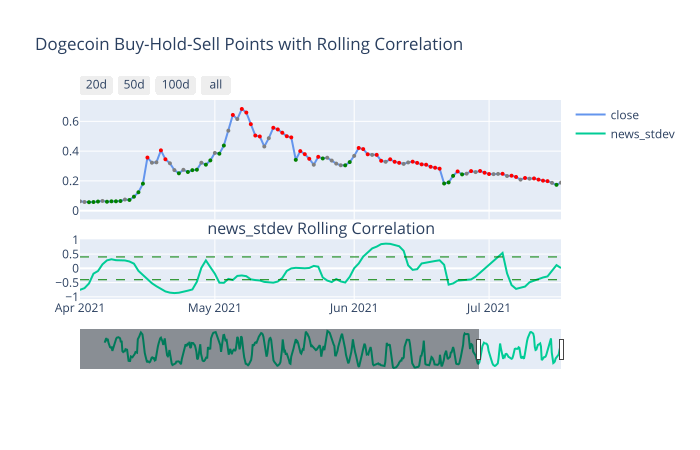

In [61]:
custom_params = dict(col='news', target=target, transformation='stdev', window=window, periods=20,
                     hlines=[dict(y=.4, line_width=1, line_dash='dash', line_color='green', row=2), 
                             dict(y=-.4, line_width=1, line_dash='dash', line_color='green', row=2)])

for df in dfs:
    rolling_corr_plot(df[0], custom_params, df[1], renderer)

##### volatility

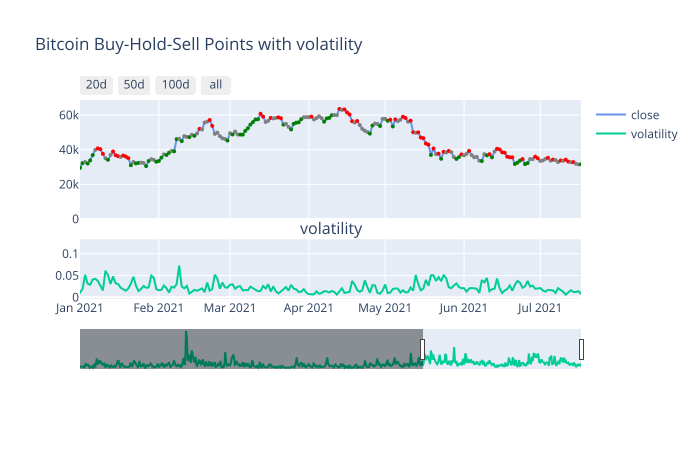

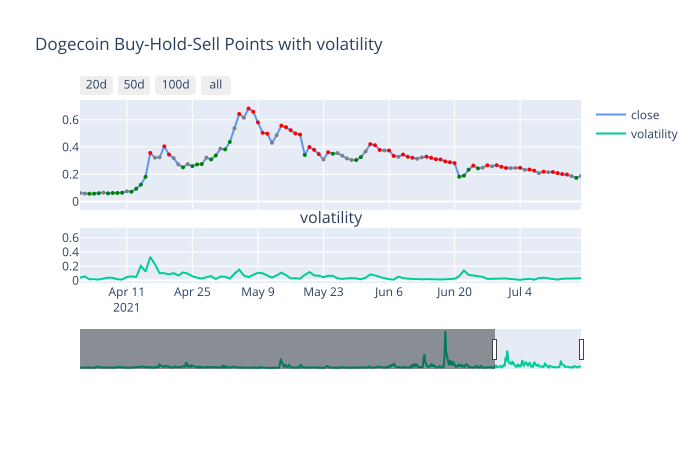

In [62]:
custom_params = dict(col='volatility', sp=None, mp=None, hlines=[])

for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

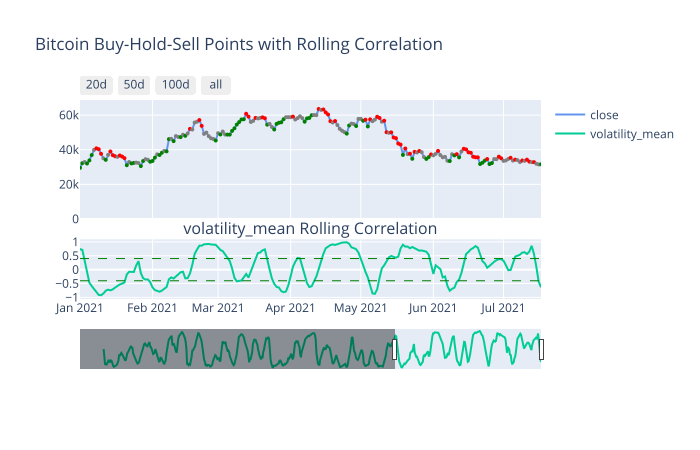

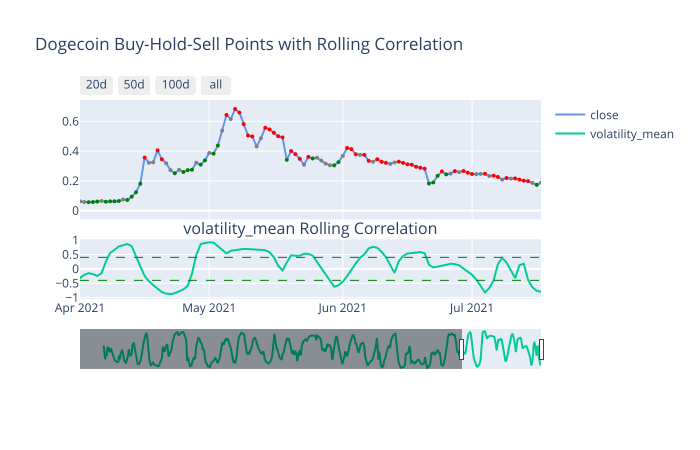

In [63]:
custom_params = dict(col='volatility', target=target, transformation='mean', window=window, periods=20,
                     hlines=[dict(y=.4, line_width=1, line_dash='dash', line_color='green', row=2), 
                             dict(y=-.4, line_width=1, line_dash='dash', line_color='green', row=2)])

for df in dfs:
    rolling_corr_plot(df[0], custom_params, df[1], renderer)

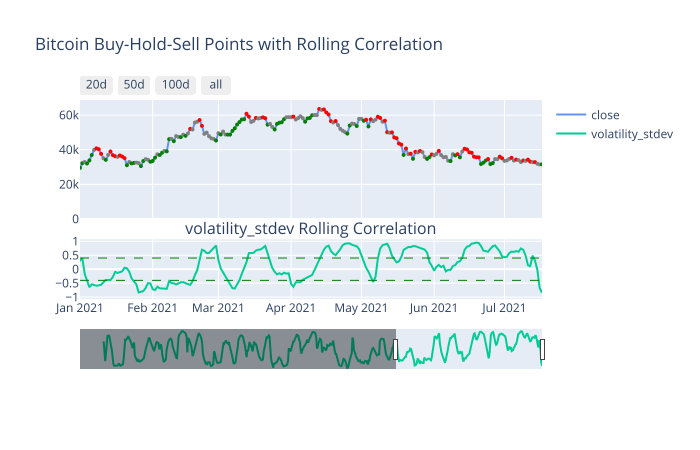

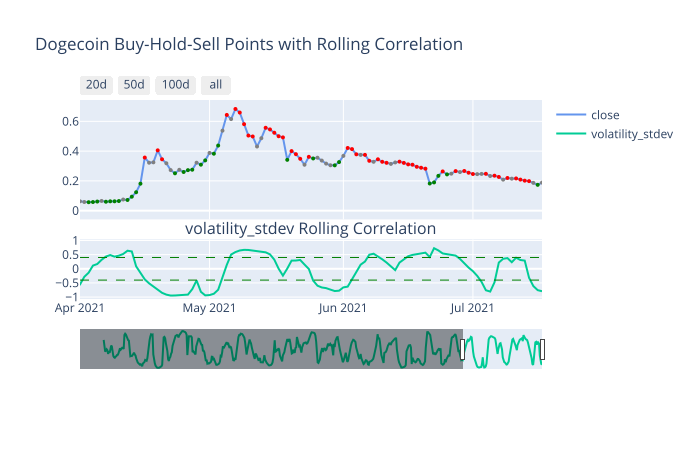

In [64]:
custom_params = dict(col='volatility', target=target, transformation='stdev', window=window, periods=20,
                     hlines=[dict(y=.4, line_width=1, line_dash='dash', line_color='green', row=2), 
                             dict(y=-.4, line_width=1, line_dash='dash', line_color='green', row=2)])

for df in dfs:
    rolling_corr_plot(df[0], custom_params, df[1], renderer)

##### market_cap_global

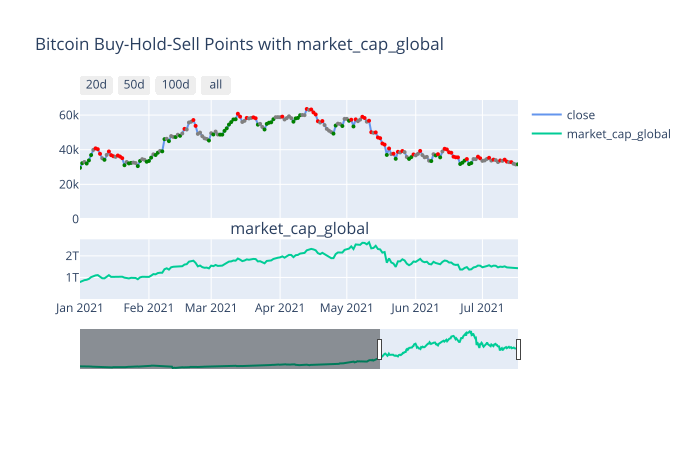

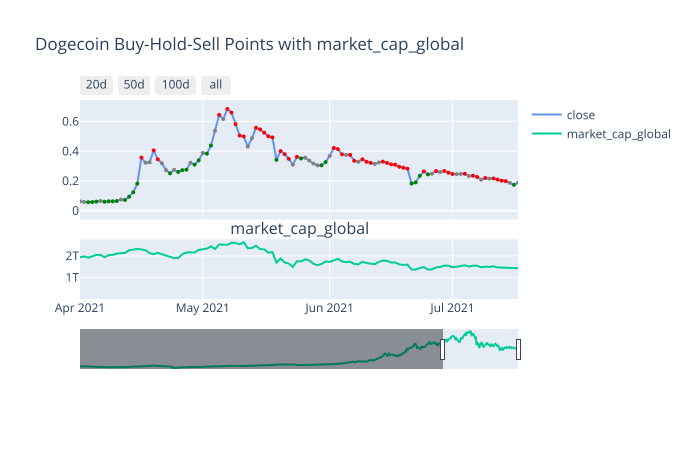

In [65]:
custom_params = dict(col='market_cap_global', sp=None, mp=None, hlines=[])

for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

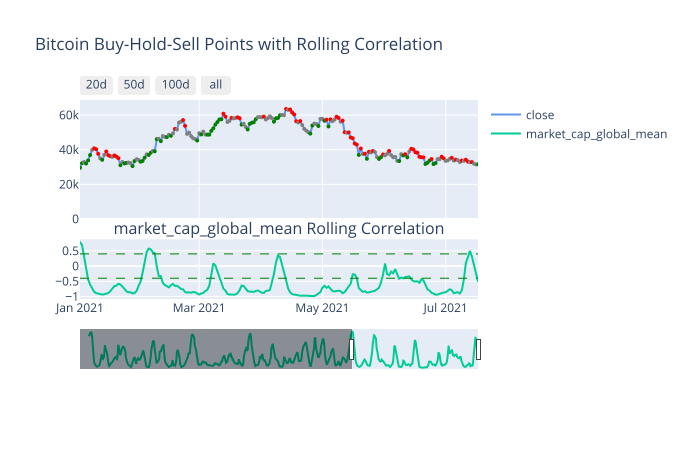

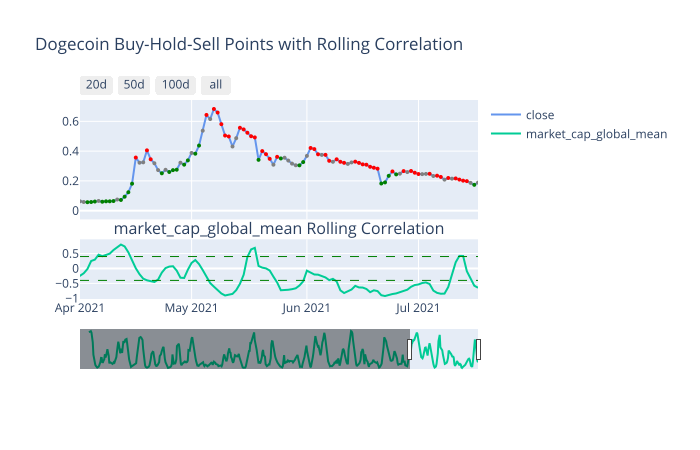

In [66]:
# market_cap_global
custom_params = dict(col='market_cap_global', target=target, transformation='mean', window=window, periods=2,
                     hlines=[dict(y=.4, line_width=1, line_dash='dash', line_color='green', row=2), 
                             dict(y=-.4, line_width=1, line_dash='dash', line_color='green', row=2)])

for df in dfs:
    rolling_corr_plot(df[0], custom_params, df[1], renderer)

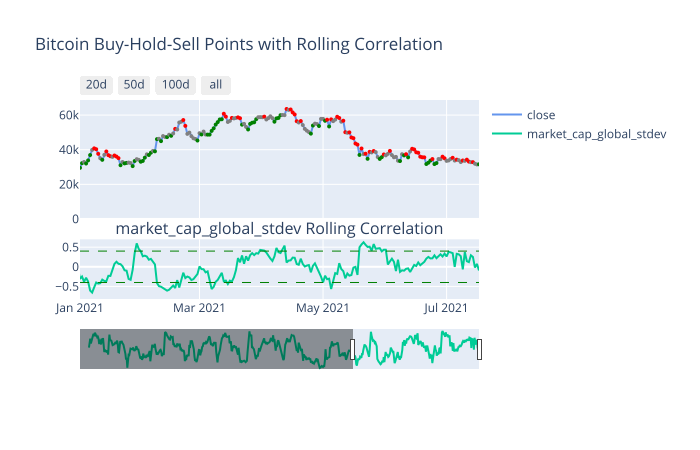

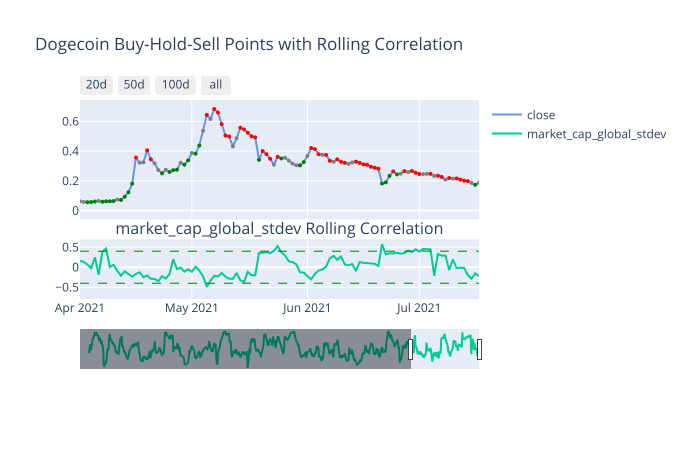

In [67]:
# market_cap_global
custom_params = dict(col='market_cap_global', target=target, transformation='stdev', window=window, periods=2,
                     hlines=[dict(y=.4, line_width=1, line_dash='dash', line_color='green', row=2), 
                             dict(y=-.4, line_width=1, line_dash='dash', line_color='green', row=2)])

for df in dfs:
    rolling_corr_plot(df[0], custom_params, df[1], renderer)

##### market_dominance

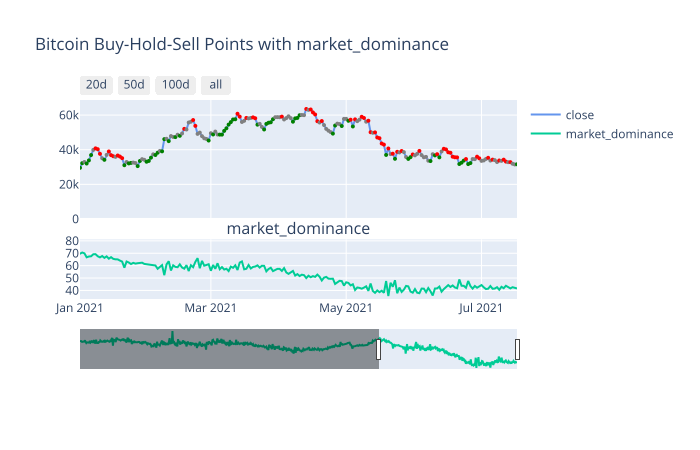

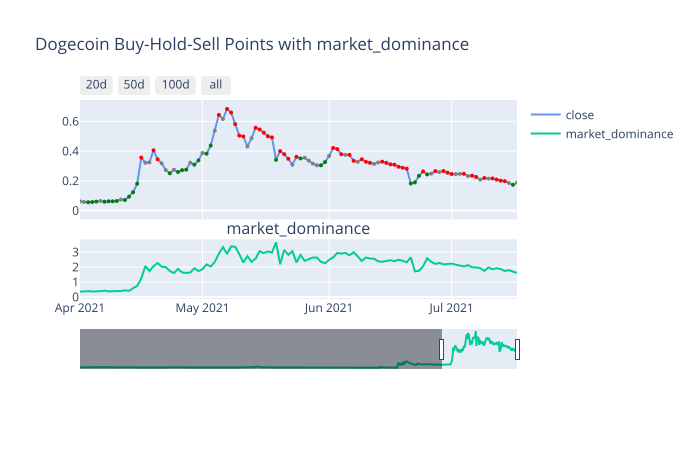

In [68]:
custom_params = dict(col='market_dominance', sp=None, mp=None, hlines=[])

for df in dfs:
        generic_bhs_plot(df[0], custom_params, df[1], renderer)

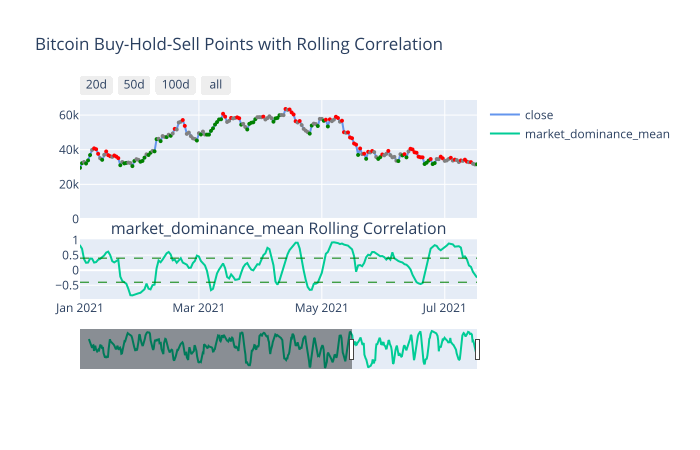

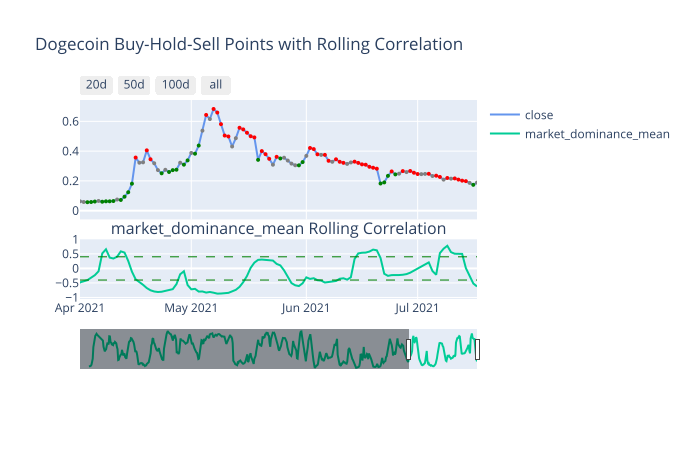

In [69]:
custom_params = dict(col='market_dominance', target=target, transformation='mean', window=window, periods=2,
                     hlines=[dict(y=.4, line_width=1, line_dash='dash', line_color='green', row=2), 
                             dict(y=-.4, line_width=1, line_dash='dash', line_color='green', row=2)])

for df in dfs:
    rolling_corr_plot(df[0], custom_params, df[1], renderer)

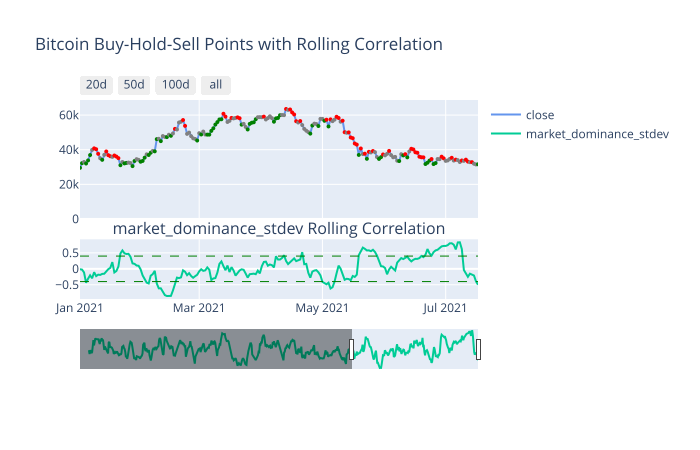

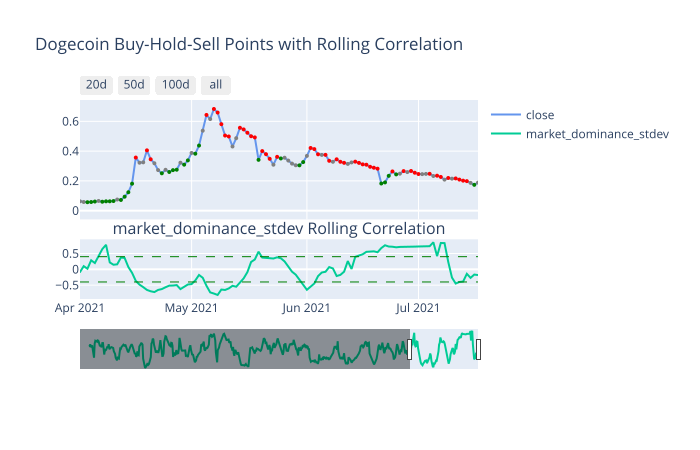

In [70]:
custom_params = dict(col='market_dominance', target=target, transformation='stdev', window=window, periods=2,
                     hlines=[dict(y=.4, line_width=1, line_dash='dash', line_color='green', row=2), 
                             dict(y=-.4, line_width=1, line_dash='dash', line_color='green', row=2)])

for df in dfs:
    rolling_corr_plot(df[0], custom_params, df[1], renderer)

## 2.4 Summary

In this phase I conducted exploratory data analysis on a variety of technical analysis metrics and indicators to identify key relationships to a forward looking window for a Buy/Hold/Sell decision for Bitcoin and Dogecoin.  I also extended this analysis to a variety of social metrics to supplement the technical analysis features for the modeling stage.  I will explore a variety of Deep Learning modeling techniques in the modeling stage to build a 7 day price prediction and a classification prediction for Buy/Hold/Sell.